<a href="https://colab.research.google.com/github/Eduardo-J-S/mineracao-dados/blob/main/Mineracao.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importando a base de dados, Pandas e as outras bibliotecas

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import GridSearchCV

from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [47]:
df = pd.read_csv('/content/drive/MyDrive/mineraçao/churn-bigml-80.csv')

# Análise Exploratória dos Dados

> Olhando as primeiras linhas do conjunto de dados para entender a estrutura

In [ ]:
df.head(10)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
5,AL,118,510,Yes,No,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False
6,MA,121,510,No,Yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False
7,MO,147,415,Yes,No,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False
8,WV,141,415,Yes,Yes,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False
9,RI,74,415,No,No,0,187.7,127,31.91,163.4,148,13.89,196.0,94,8.82,9.1,5,2.46,0,False


> Verificando as informações básicas do conjunto de dados

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

O conjunto de dados possui 2666 entradas e 20 colunas.

Nessa primeira visualização dos dados podemos observar que a maioria das colunas são de dados numericos, exceto as colunas de "State", "International plan", "Voice mail plan" e "Churn", em que as 3 primeiras são Object (Estado onde o cliente reside, e os outros valores de de "Sim" ou "Não") e a Churn booleana (com valores de verdadeiro ou falso).

> Obtendo estatísticas descritivas básicas das colunas numéricas

In [ ]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [ ]:
pip install -U ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Sobre as informações do Pandas Profiling podemos extrair que:

Iremos utilizar a coluna Churn para saída;

Percebemos que ela está muito desbalanceada, necessitando de algumas tecnicas para fazer o desbalanceamento a posterior;

Temos 2665 dados, mas que podem se tornar em média 700 posteriormente, já que podemos usar o undersampling como técnica para o desbalanceamento de classes;

Não temos dados ausentes e nem dados duplicados.

## Análise características

> Iremos analisar mais especificamente as características da nossa base de dados para visualizar melhor quais podem ser mais influentes na detecção de Churn, culminando também em quais características são as mais importantes, por termos uma base de dados aparentemente com um grande número de características.

### Interpretação Geral da Matriz de Correlação

#### Churn

**Customer service calls (0.321)** - Essa característica tem uma correlação positiva e moderada com churn, o que indica que um maior número de ligações para o serviço ao cliente podem ter uma maior probabilidade de cancelar o plano.

**International plan (0.275)** - Essa característica tem uma correlação positiva e moderada com churn, o que sugere que os clientes que tem um plano internacional podem ter uma maior probabilidade de cancelar o plano.

**Total day charge (0.343) e Total day minutes (0.344)** - Essas duas características têm uma correlação positiva com churn, o que indica que clientes que gastam mais em chamadas diárias podem ter uma probabilidade maior a cancelar o plano.

**Number vmail messages (0.108)** - Essa característica tem uma correlação mais fraca, mas ainda podem indicar que mais mensagens de voz podem estar relacionadas ao churn.

**Voice mail plan (0.096)** - Essa característica é ainda mais fraca que a anterior, mas ainda pode indicar que clientes com plano de correio de voz podem ter um pouco mais de probabilidade de cancelar o plano.

**Total intl calls (0.093)** - Característica com correlação fraca, mas que pode indicar que quanto mais chamadas internacionais um cliente faz, maior pode ser a probabilidade do cliente cancelar o plano.

**Total intl charge (0.068) e Total intl minutes (0.068)** - As duas características têm baixa correlação com churn, mas podem indicar que o tempo e o custo das chamadas internacionais podem ter impacto na probabilidade do cliente cancelar o plano.

#### Multicolinearidade entre Características

> A multicolinearidade é uma situação em que duas ou mais variáveis independentes em um modelo de regressão (é igualmente relevante em problemas de classificação) encontram-se altamente correlacionadas. Essa alta correlação pode afetar a qualidade dos resultados do modelo e dificultar a interpretação dos resultados.

**Total day charge e Total day minutes (1.000)** - Essas duas características tem uma correlação perfeita, o que é esperado já que o total cobrado de ligações durante o dia é uma função do total de minutos.

**Total eve charge e Total eve minutes (1.000)** - Essas duas características também tem correlação perfeita assim como a anterior, só que para ligações a noite.

**Total intl charge e Total intl minutes (1.000)** - Essa outras duas características seguem a mesma lógica das outras com correlação perfeita e com cobrança total de acordo com os minutos usados.

**Number vmail messages e Voice mail plan (0.998)** - Uma correlação quase perfeita entre essas duas características pois para ter mais mensagens de voz só é possível se o cliente tiver um plano de correio de voz.

#### Outras Características

**Account length (0.000)** - Account length tem a correlação de zero com churn, o que indica que o tempo que o cliente tem uma conta não está relacionado com a probabilidade do cliente cancelar o plano.

**Area code** - A área do código não tem correlação com churn o que indica que o código da área do cliente não é uma característica relevante para o cancelamento.

**Total night charge (0.071) e Total night minutes (0.070)** - Essas características tem uma correlação fraca com churn, mas ainda assim são características positivas.

**Total eve charge (0.050) e Total eve minutes (0.050)** - Outras características que são fracas de correlação com churn, mas ainda são positivas.

#### Seleção de Características

Com base na análise de correlação das características, podemos tomar as seguintes decisões para selecionar as características mais importantes para o nosos projeto e talvez produzir um desempenho melhor posteriormente:

Mater as características mais relevantes: Customer service calls, International plan, Total day charge (ou Total day minutes), que tem um forte correlação com churn, o que sugere que elas têm um alto impacto no cancelamento.

Remover as características com alta multicolineridade: Escolhendo entre Total day charge e Total day minutes e entre Total intl charge e Total intl minutes, para reduzir a redundancia no modelo.

E embora algumas características apresentem correlações fracas, podemos optar por considerar a possibilidade delas individualmente ou em combinação terem uma relevância para o cancelamento. E que essa relevância individual ou em conjunto pode ser captada melhor pelos algoritmos inteligentes.

### Análise aprofundada variáveis maior correlação

> Iremos analisar algumas características que têm maior correlação com o churn. A ideia é entender como essas variáveis se comportam e qual pode ser sua influência na decisão de churn dos clientes.

Vamos focar nas variáveis com maior correlação com Churn, como:

- Customer service calls
- International plan
- Total day charge
- Voice mail plan
- Number vmail messages
- Total intl calls
- Total intl charge
- Total day minutes
- Total intl minutes

#### Customer service calls

> Essa é uma coluna que representa o número de chamadas que um cliente fez para o serviço de atendimento ao cliente. Essas ligações podem indicar uma insatisfação com o serviço, principalmente se essas chamadas tiverem um número alto de repetições.

Customer service calls - Descrição Estatística
count    2666.000000
mean        1.562641
std         1.311236
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: Customer service calls, dtype: float64


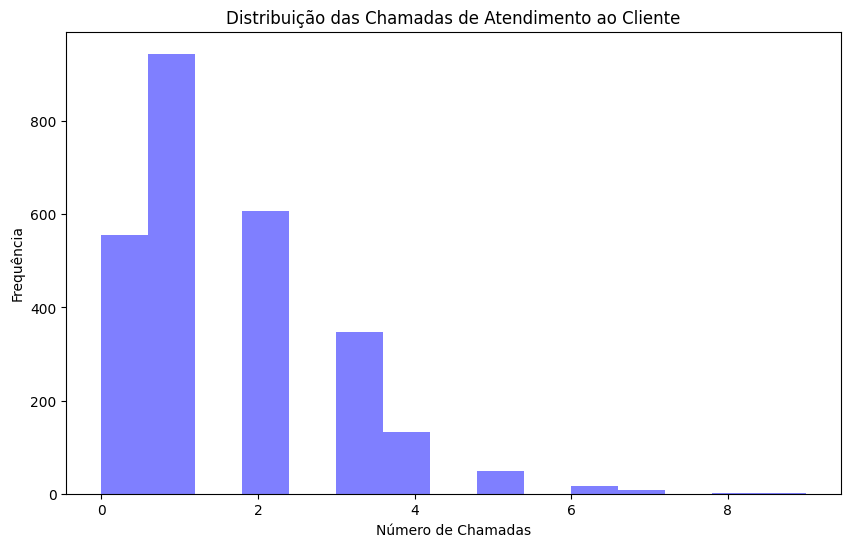

In [ ]:
import matplotlib.pyplot as plt

print("Customer service calls - Descrição Estatística")
print(df['Customer service calls'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Customer service calls'], bins=15, alpha=0.5, color='blue')
plt.title('Distribuição das Chamadas de Atendimento ao Cliente')
plt.xlabel('Número de Chamadas')
plt.ylabel('Frequência')
plt.show()

Percebe-se que em média os clientes ligam ao menos uma vez para o serviço de atendimento ao cliente, mas podemos obeservar que temos valores de ligação igual a zero, o que indica que alguns clientes ligaram mais de uma vez para o atendimento.

O número máximo de chamadas é de 9, o que pode mostrar uma grande insatisfação desse(s) cliente(s), mas precisamos tomar cuidado com esses dados pois eles podem indicar outliers.

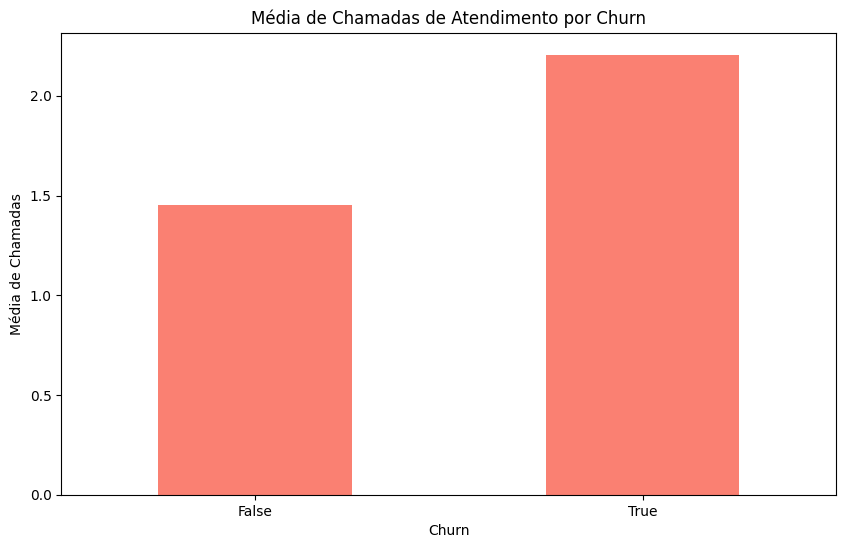

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Customer service calls'].mean().plot(kind='bar', color='salmon')
plt.title('Média de Chamadas de Atendimento por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Chamadas')
plt.xticks(rotation=0)
plt.show()

Analisando esse gráfico do número de chamadas que um cliente fez para o serviço de atendimento ao cliente, podemos observar que os clientes que deram churn fizeram um maior número de chamadas a esse serviço comparados com os que ligaram menos.

In [ ]:
data = df['Customer service calls']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 1.0, Q3: 2.0, IQR: 1.0, Limite Inferior: -0.5, Limite Superior: 3.5
Outliers: [4, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 4, 5, 4, 4, 4, 4, 4, 4, 7, 4, 4, 4, 4, 4, 5, 4, 4, 4, 5, 4, 7, 9, 4, 4, 4, 4, 5, 4, 4, 5, 5, 6, 5, 4, 4, 5, 4, 7, 4, 6, 5, 4, 4, 6, 4, 4, 5, 4, 4, 5, 6, 5, 4, 4, 4, 4, 4, 5, 5, 4, 4, 6, 4, 5, 4, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 6, 5, 7, 4, 4, 5, 4, 4, 4, 4, 5, 7, 4, 5, 7, 4, 4, 4, 8, 4, 4, 5, 5, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 6, 4, 4, 5, 5, 4, 6, 4, 4, 4, 9, 6, 4, 5, 5, 6, 4, 4, 4, 5, 5, 6, 4, 4, 4, 5, 4, 4, 4, 5, 4, 5, 6, 4, 4, 5, 4, 4, 4, 5, 4, 4, 4, 5, 5, 6, 7, 5, 5, 4, 6, 4, 4, 4, 5, 6, 7, 4, 4, 5, 5, 4, 4, 5, 6, 5, 4, 4, 4, 4, 4, 4, 4, 4, 5]


Os outliers são os valores que estão acima do limite superior de 3.5. A lista de outliers inclui chamadas de serviço ao cliente com frequência de 4 ou mais. A presença de muitos valores de 4 ou mais indica que há uma quantidade significativa de clientes que realizaram um número elevado de chamadas para o serviço ao cliente, o que pode indicar problemas de atendimento ou insatisfação dos clientes com plano.

#### International plan

> Essa coluna indica se um cliente tem ou não um plano internacional.

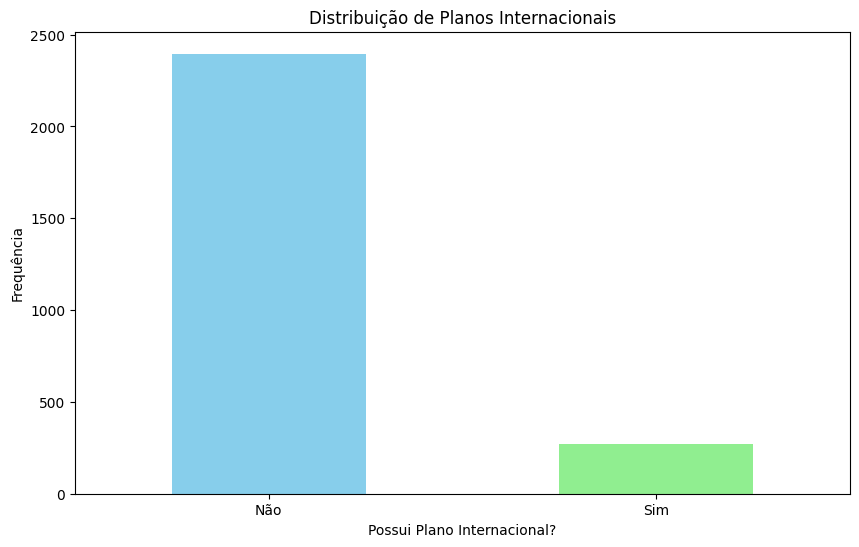

In [ ]:
plt.figure(figsize=(10, 6))
df['International plan'].value_counts().plot(kind='bar', color=['skyblue', 'lightgreen'])
plt.title('Distribuição de Planos Internacionais')
plt.xlabel('Possui Plano Internacional?')
plt.ylabel('Frequência')
plt.xticks(ticks=[0, 1], labels=['Não', 'Sim'], rotation=0)
plt.show()

Podemos observar que A distribuição dos planos internacionais na nossa base de dados indica que a maioria dos clientes não possui um plano internacional, enquanto apenas uma pequena parte opta por adquiri-lo.

O que sugere que o plano internacional oferecido não atende plenamente às expectativas dos clientes.

<Figure size 1000x600 with 0 Axes>

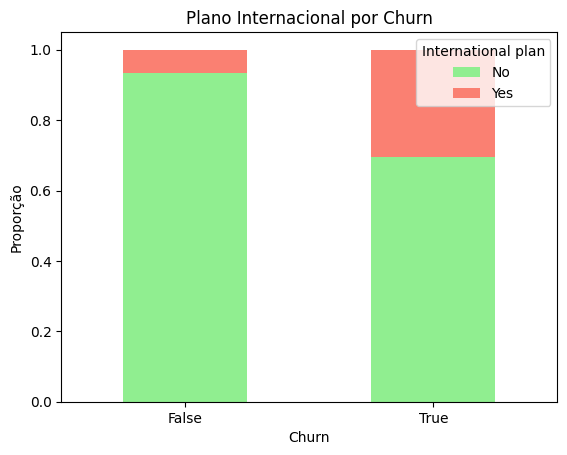

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['International plan'].value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=['lightgreen', 'salmon'])
plt.title('Plano Internacional por Churn')
plt.xlabel('Churn')
plt.ylabel('Proporção')
plt.xticks(rotation=0)
plt.show()

Podemos obeservar que há uma tendência de Churn entre clientes com planos internacionais, o que reforça que o plano pode não atender as expectativas dos clientes. Mas também temos Churn em clientes que não tem os planos internacionais, indicando que outros fatores além do plano internacional podem estar contribuindo para o cancelamento dos serviços.

#### Total day charge

> Essa coluna representa a cobrança total durante o dia.

Total day charge - Descrição Estatística
count    2666.000000
mean       30.512404
std         9.215733
min         0.000000
25%        24.380000
50%        30.590000
75%        36.700000
max        59.640000
Name: Total day charge, dtype: float64


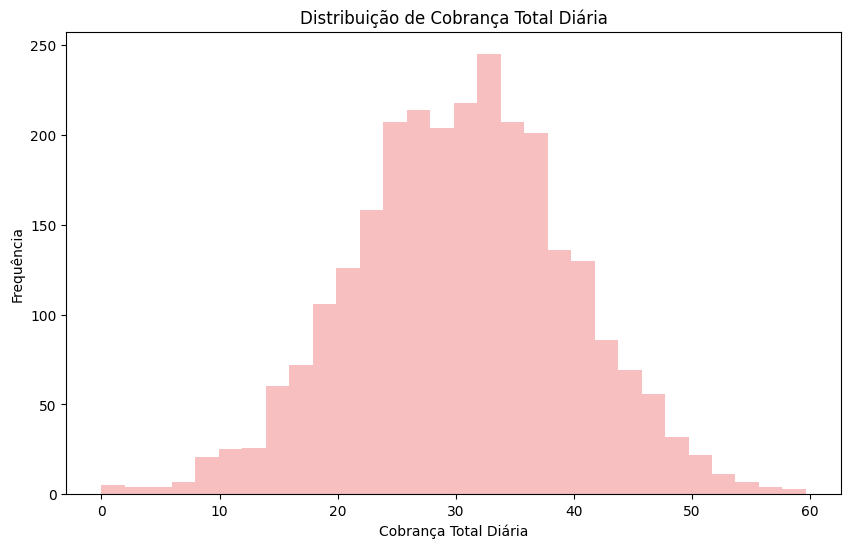

In [ ]:
print("Total day charge - Descrição Estatística")
print(df['Total day charge'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Total day charge'], bins=30, alpha=0.5, color='lightcoral')
plt.title('Distribuição de Cobrança Total Diária')
plt.xlabel('Cobrança Total Diária')
plt.ylabel('Frequência')
plt.show()

Podemos analisar que em média a cobrança diária está em torno de 30.51, sugerindo que muitos clientes estão pagando esse valor diariamente. A distribuição desses dados é relativamente simétrica, sem a presença significativa de valores extremos que possam distorcer a média.

Além disso, observa-se uma variação considerável nesses valores, onde alguns clientes podem ter cobranças diárias significativamente mais altas, enquanto outros pagam valores bem menores.

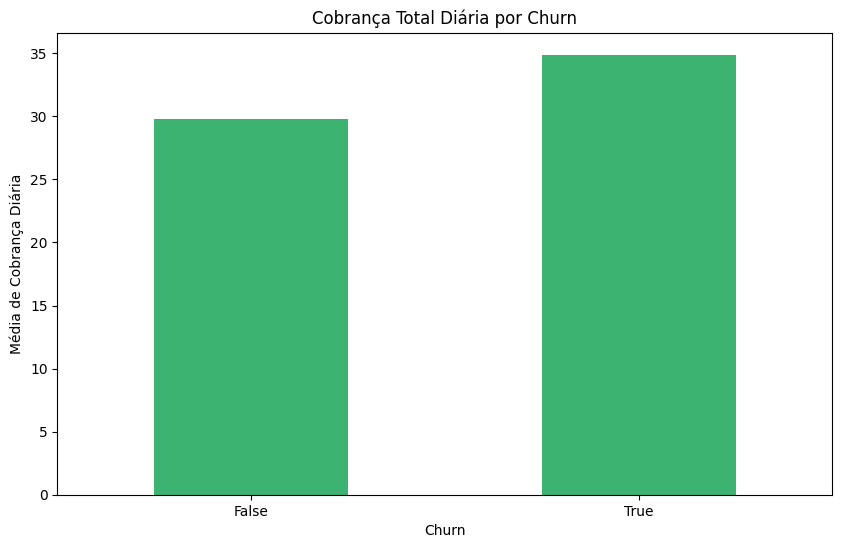

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Total day charge'].mean().plot(kind='bar', color='mediumseagreen')
plt.title('Cobrança Total Diária por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Cobrança Diária')
plt.xticks(rotation=0)
plt.show()

Clientes que realizaram churn apresentam, em média, uma cobrança diária mais alta, o que pode sugerir uma insatisfação com o custo diário. No entanto, a diferença entre a média de cobranças diárias dos clientes que deram churn e daqueles que não deram churn não é tão significativa, indicando que até mesmo clientes que permanecem com o serviço também enfrentam custos diários elevados.

In [ ]:
data = df['Total day charge']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 24.38, Q3: 36.7, IQR: 12.320000000000004, Limite Inferior: 5.899999999999995, Limite Superior: 55.18000000000001
Outliers: [57.36, 59.64, 57.04, 5.25, 5.78, 58.96, 2.13, 0.0, 0.0, 3.32, 56.07, 1.34, 55.78, 4.59, 2.99, 55.47, 58.7, 0.44, 1.33, 3.21, 5.08]


Os valores baixos próximos a 0 é o seu limite inferiror e valores superiores a 55.18 é seu limite superiror.

O valor mais alto identificado sendo 59.64 são os clientes que têm cobranças diárias significativamente altas.

O valores próximos a zero ou de zero indicam clientes com baixas ou nulas cobranças diárias podem indicar falta de engajamento com o serviço.

#### Total day minutes

> O número total de minutos usados durante chamadas diurnas. Esta é uma métrica essencial para entender o comportamento de chamada de um cliente durante os horários de pico.

Total day minutes - Descrição Estatística
count    2666.00000
mean      179.48162
std        54.21035
min         0.00000
25%       143.40000
50%       179.95000
75%       215.90000
max       350.80000
Name: Total day minutes, dtype: float64


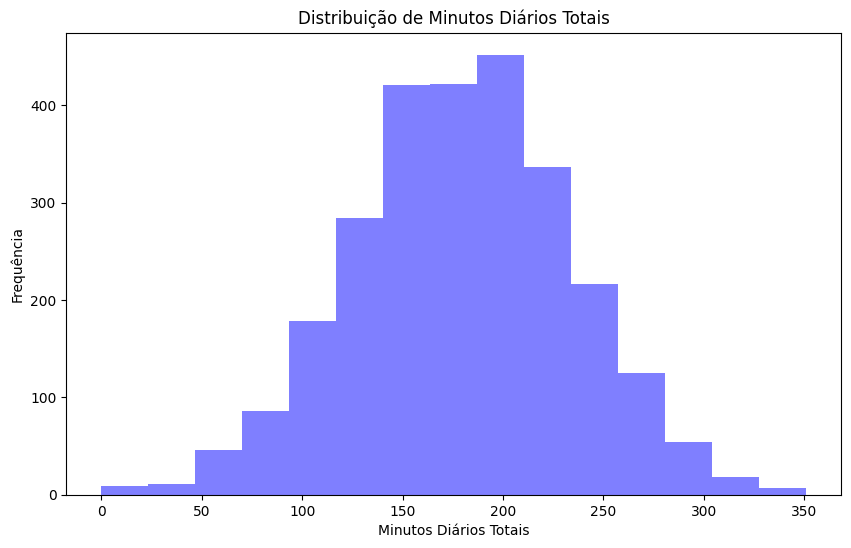

In [ ]:
print("Total day minutes - Descrição Estatística")
print(df['Total day minutes'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Total day minutes'], bins=15, alpha=0.5, color='blue')
plt.title('Distribuição de Minutos Diários Totais')
plt.xlabel('Minutos Diários Totais')
plt.ylabel('Frequência')
plt.show()

Podemos analisar que a mediana e a média estão muito próximas, sugerindo que a distribuição dos Total day minutes é aproximadamente simétrica. Contudo, o desvio padrão relativamente alto e a presença de valores extremos (0 minutos e 350.8 minutos) indicam uma certa variabilidade no comportamento dos clientes.

 A presença de valores mínimos de 0 minutos pode indicar clientes que não utilizam o serviço de minutos diários, o que pode ser relevante ao analisar o churn.

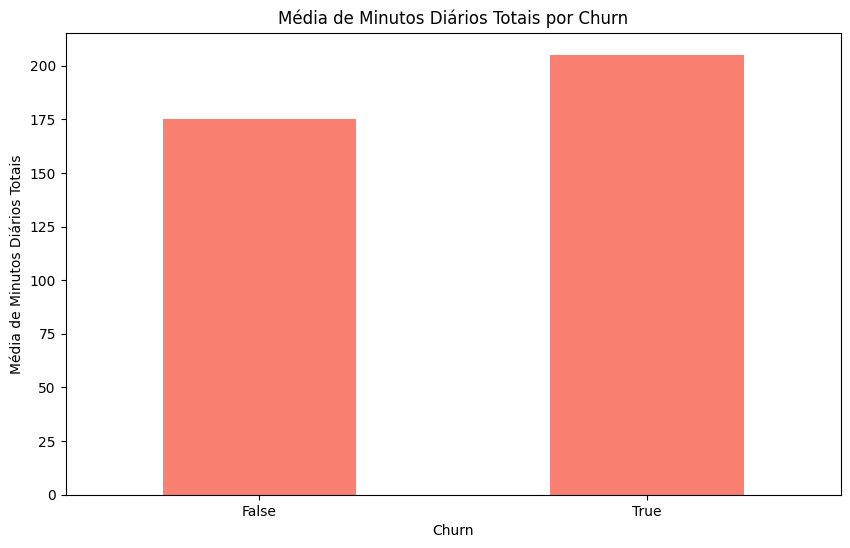

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Total day minutes'].mean().plot(kind='bar', color='salmon')
plt.title('Média de Minutos Diários Totais por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Minutos Diários Totais')
plt.xticks(rotation=0)
plt.show()

Assim como na coluna Total day charge, na coluna Total day minutos os clientes que realizaram churn apresentam, em média, um uso de minutos diário em chamadas mais alto, o que pode sugerir uma insatisfação com o custo diário, pois usando mais, eles obtem mais gastos.

No entanto, a diferença entre a média de uso de minutos diários dos clientes que deram churn e daqueles que não deram churn não é tão significativa, indicando que até mesmo clientes que permanecem com o serviço também tem um número de minutos em chamadas diárias alta.

In [ ]:
data = df['Total day minutes']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 143.4, Q3: 215.9, IQR: 72.5, Limite Inferior: 34.650000000000006, Limite Superior: 324.65
Outliers: [337.4, 350.8, 335.5, 30.9, 34.0, 346.8, 12.5, 0.0, 0.0, 19.5, 329.8, 7.9, 328.1, 27.0, 17.6, 326.3, 345.3, 2.6, 7.8, 18.9, 29.9]


Esses outliers representam clientes que estão utilizando muito mais minutos do que a maioria. Eles podem ser usuários mais exigentes ou que dependem mais do serviço. Esses clientes podem ter necessidades diferentes e possivelmente têm um maior impacto sobre a rede.

Essa coluna tem uma variação significativa, com alguns clientes utilizando muito mais ou muito menos minutos diários do que a média. Esses extremos podem ser relevantes para entender o comportamento dos clientes, especialmente em relação ao churn.

#### Voice mail plan

> Essa coluna indica se um cliente possui um plano de caixa postal.

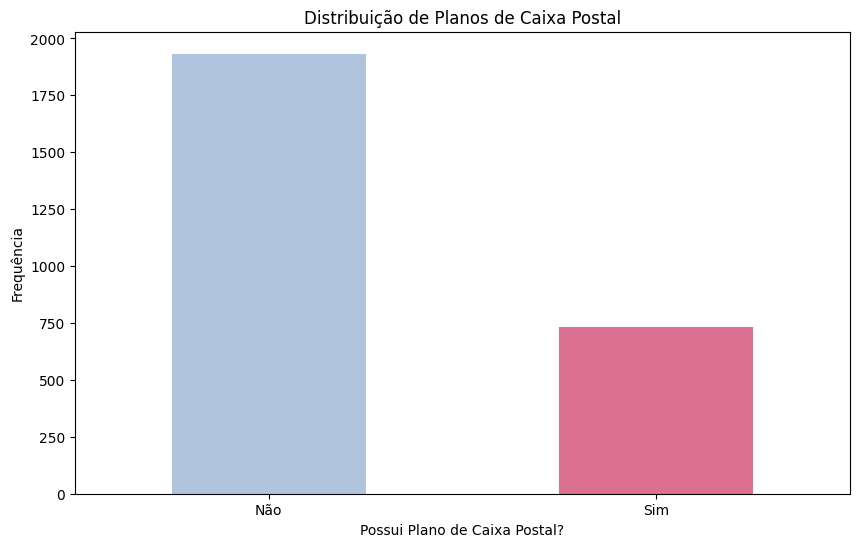

In [ ]:
plt.figure(figsize=(10, 6))
df['Voice mail plan'].value_counts().plot(kind='bar', color=['lightsteelblue', 'palevioletred'])
plt.title('Distribuição de Planos de Caixa Postal')
plt.xlabel('Possui Plano de Caixa Postal?')
plt.ylabel('Frequência')
plt.xticks(ticks=[0, 1], labels=['Não', 'Sim'], rotation=0)
plt.show()

Podemos observar que a maioria dos clientes da nossa base de dados não possui um plano e caixa postal, o que pode indicar uma falta de interesse ou necessidade por parte dos usuários em relação a esse serviço.

<Figure size 1000x600 with 0 Axes>

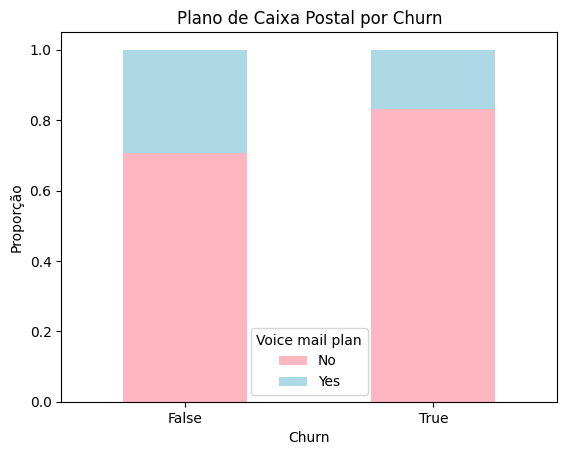

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Voice mail plan'].value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=['lightpink', 'lightblue'])
plt.title('Plano de Caixa Postal por Churn')
plt.xlabel('Churn')
plt.ylabel('Proporção')
plt.xticks(rotation=0)
plt.show()

Aqui podemos observar uma correlação entre clientes que possuem um plano de caixa postal e o churn, mas é importante notar que a maioria dos clientes que mantêm o plano de caixa postal não cancelou o serviço.

Isso sugere que, embora ter um plano de caixa postal possa influenciar no churn, não parece ser uma variável com grande impacto isolado.

#### Number vmail messages

> Esta coluna representa o número de mensagens de voz recebidas pelo cliente. Pode ser útil entender se a quantidade de mensagens de voz tem alguma relação com o churn.

Number vmail messages - Descrição Estatística
count    2666.000000
mean        8.021755
std        13.612277
min         0.000000
25%         0.000000
50%         0.000000
75%        19.000000
max        50.000000
Name: Number vmail messages, dtype: float64


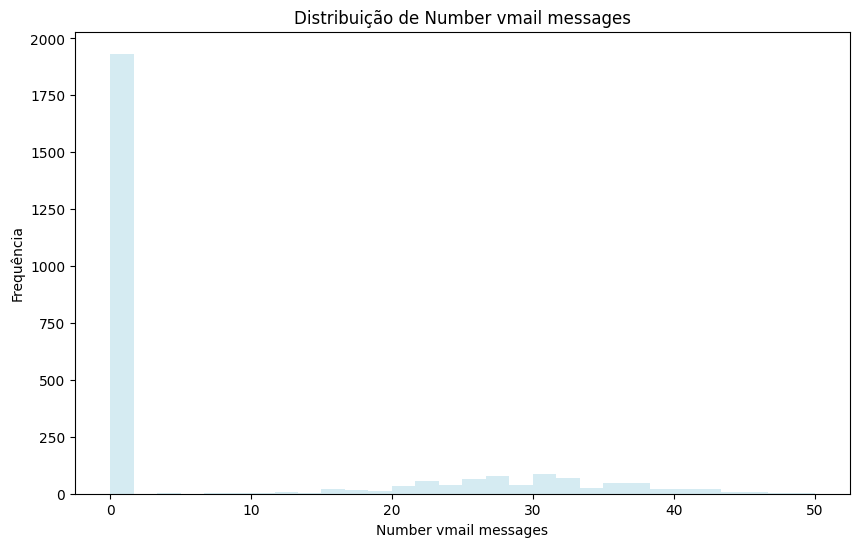

In [ ]:
print("Number vmail messages - Descrição Estatística")
print(df['Number vmail messages'].describe())


plt.figure(figsize=(10, 6))
plt.hist(df['Number vmail messages'], bins=30, alpha=0.5, color='lightblue')
plt.title('Distribuição de Number vmail messages')
plt.xlabel('Number vmail messages')
plt.ylabel('Frequência')
plt.show()

Podemos analisar que a média de mensagens recebidas pelos clientes é de 8.02, mas a maioria dos clientes não recebeu nenhuma mensagem, o que resulta em uma variância de 13.61. Com um valor máximo de 50 mensagens, essa coluna apresenta possíveis outliers que podem necessitar de tratamento posterior.

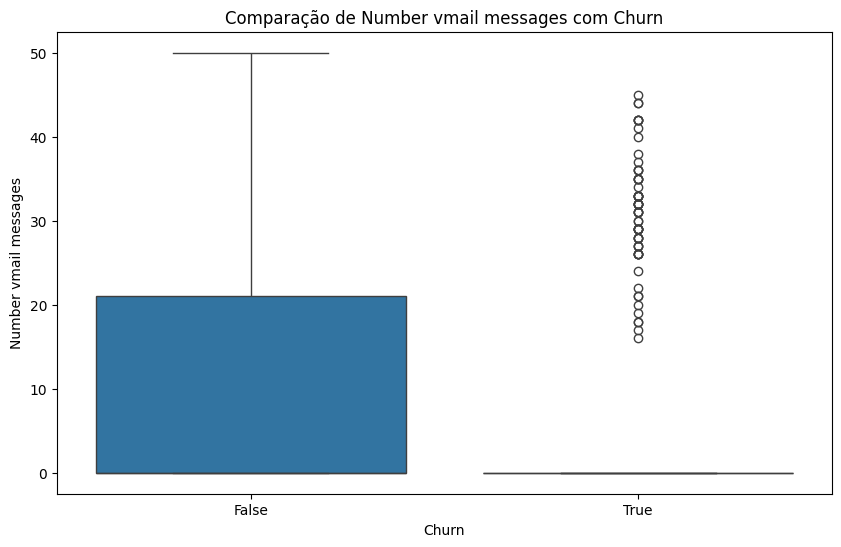

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Churn', y='Number vmail messages', data=df)
plt.title('Comparação de Number vmail messages com Churn')
plt.xlabel('Churn')
plt.ylabel('Number vmail messages')
plt.show()

* Podemos analisar que os clientes que mais receberam mensagens de voz, são em sua maioria clietes que deram churn.

In [ ]:
data = df['Number vmail messages']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 0.0, Q3: 19.0, IQR: 19.0, Limite Inferior: -28.5, Limite Superior: 47.5
Outliers: [50, 50]


A maioria dos clientes (até o 75º percentil) tem até 19 mensagens de voicemail, o que sugere que o uso do serviço é relativamente baixo na maior parte da base de clientes. Os valores de 50 mensagens de voicemail são considerados outliers, pois estão acima do limite superior de 47.5.

Podemos analisar que essa coluna tem uma distribuição com poucos outliers e a maioria dos clientes utiliza pouco ou nada o serviço de voicemail.

#### Total intl calls

> Esta coluna representa o número total de chamadas internacionais realizadas pelo cliente.

Total intl calls - Descrição Estatística
count    2666.000000
mean        4.467367
std         2.456195
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: Total intl calls, dtype: float64


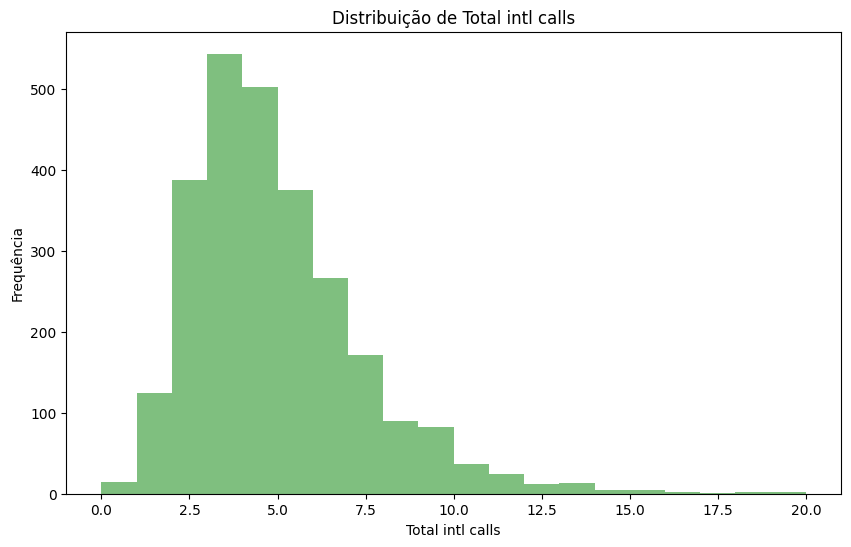

In [ ]:
print("Total intl calls - Descrição Estatística")
print(df['Total intl calls'].describe())


plt.figure(figsize=(10, 6))
plt.hist(df['Total intl calls'], bins=20, alpha=0.5, color='green')
plt.title('Distribuição de Total intl calls')
plt.xlabel('Total intl calls')
plt.ylabel('Frequência')
plt.show()

A análise dos dados mostra que o número médio de ligações internacionais por cliente é de aproximadamente 4 chamadas, com um desvio padrão de 2, indicando uma variabilidade moderada no comportamento dos clientes. O número máximo de chamadas internacionais registrado é de 20, o que sugere a presença de um grupo específico de clientes que fazem uso frequente desse serviço. Esse perfil pode ser associado a clientes que mantêm contatos regulares fora do país, e essa utilização mais intensa pode influenciar suas expectativas e percepções sobre os serviços.

<ipython-input-190-b0a6ad3f1a52>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total intl calls', data=df, palette='OrRd')


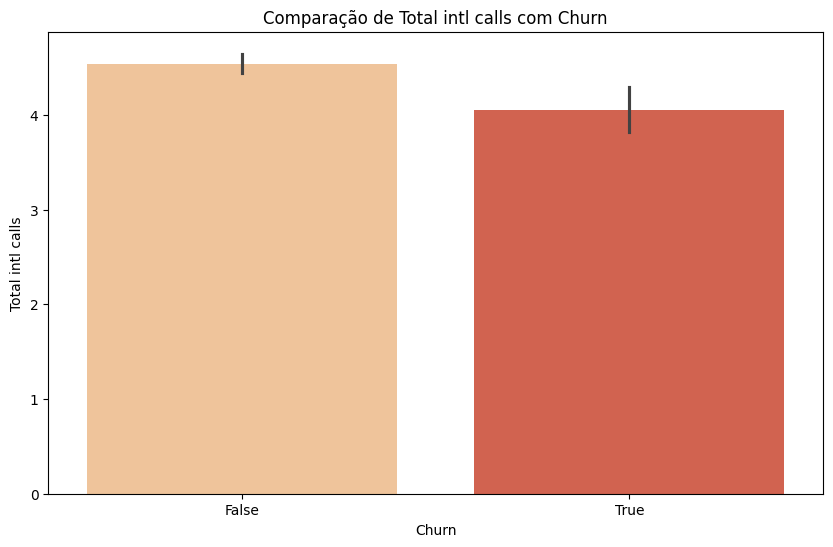

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Churn', y='Total intl calls', data=df, palette='OrRd')
plt.title('Comparação de Total intl calls com Churn')
plt.xlabel('Churn')
plt.ylabel('Total intl calls')
plt.xticks(rotation=0)
plt.show()

Podemos analisar que o número de chamadas internacionais pode ter uma certa influência no churn, mas não se mostra como um fator determinante. Como podemos visualizar no gráfico, há presença de valores elevados de chamadas internacionais, que poderiam ser considerados outliers, tanto entre os clientes que cancelaram (churn) quanto entre aqueles que não cancelaram. Isso indica que, embora a frequência de ligações internacionais possa impactar a decisão de cancelar o serviço, ela não é isoladamente um preditor confiável para o churn.

In [ ]:
data = df['Total intl calls']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 3.0, Q3: 6.0, IQR: 3.0, Limite Inferior: -1.5, Limite Superior: 10.5
Outliers: [19, 15, 11, 12, 13, 11, 12, 11, 13, 12, 11, 11, 18, 11, 13, 12, 12, 13, 11, 11, 14, 13, 11, 13, 12, 11, 14, 15, 18, 13, 11, 14, 11, 14, 15, 12, 11, 16, 11, 11, 11, 11, 11, 14, 11, 12, 13, 11, 11, 16, 13, 13, 11, 15, 11, 12, 13, 12, 12, 12, 11, 13, 11, 13, 20, 17]


Não foram identificados valores abaixo do limite inferior, já que as chamadas internacionais são uma variável discreta (ou seja, o número de chamadas é sempre zero ou positivo).

Os valores acima de 10.5 são considerados outliers. Isso sugere que existem clientes que fazem um número relativamente alto de chamadas internacionais. O valor máximo encontrado foi 20 chamadas, o que é significativamente maior do que a maioria dos dados na distribuição. O que pode indicar clientes com um comportamente específico.

#### Total intl charge

> Esta coluna representa o total de cobranças relacionadas às chamadas internacionais.

Total intl charge - Descrição Estatística
count    2666.000000
mean        2.764490
std         0.752812
min         0.000000
25%         2.300000
50%         2.750000
75%         3.270000
max         5.400000
Name: Total intl charge, dtype: float64


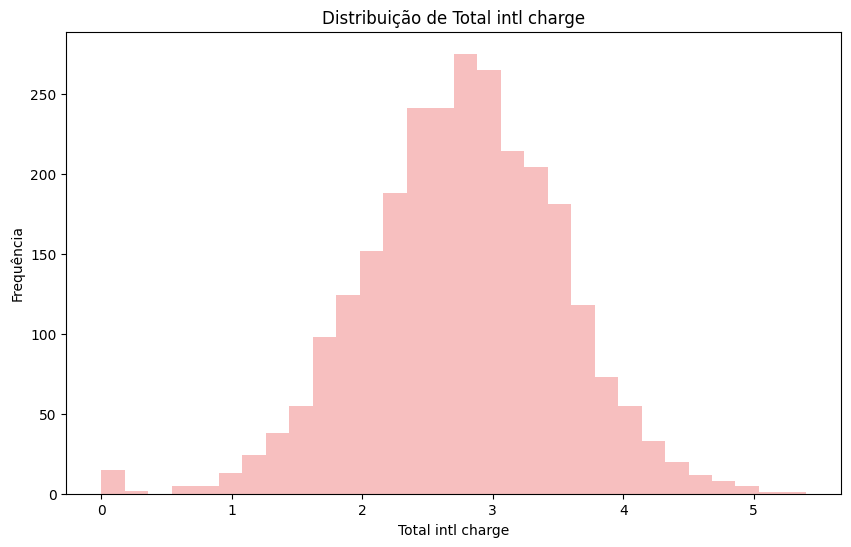

In [ ]:
print("Total intl charge - Descrição Estatística")
print(df['Total intl charge'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Total intl charge'], bins=30, alpha=0.5, color='lightcoral')
plt.title('Distribuição de Total intl charge')
plt.xlabel('Total intl charge')
plt.ylabel('Frequência')
plt.show()

A maioria das cobranças internacionais está concentrada entre 2,30 e 3,27, indicando que a maioria dos clientes possui gastos moderados com chamadas internacionais. No entanto, há uma pequena quantidade de clientes que pagam valores significativamente mais altos, chegando até $5,40. A presença de um valor mínimo de 0 sugere que uma proporção de clientes não faz uso de chamadas internacionais.

Com um desvio padrão de 0,752 e um valor máximo de 5,400, podemos observar que, embora exista alguma variação entre os clientes, essa variação não é excessivamente dispersa. Isso implica que os custos de chamadas internacionais são relativamente consistentes para a maioria dos clientes, com exceção de alguns casos isolados.

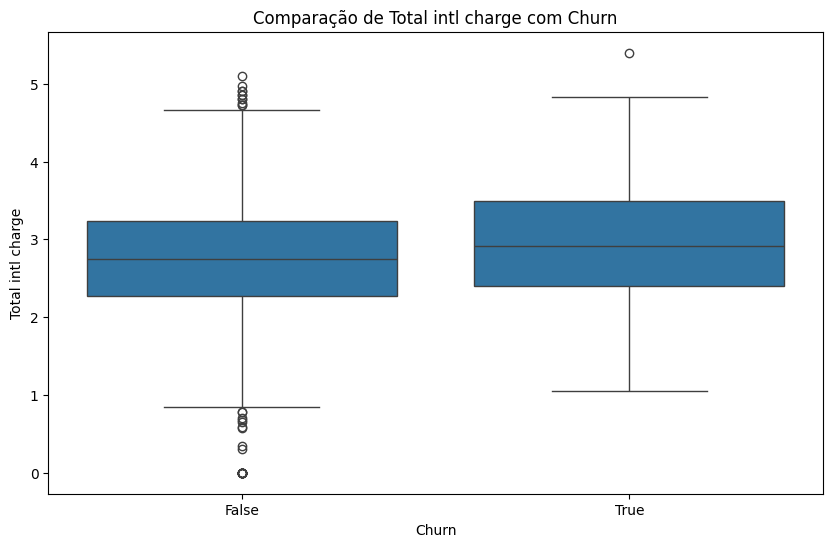

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Churn', y='Total intl charge', data=df)
plt.title('Comparação de Total intl charge com Churn')
plt.xlabel('Churn')
plt.ylabel('Total intl charge')
plt.show()

Podemos observar que, tanto para clientes que não cancelaram o plano quanto para os que cancelaram, a mediana do total de cobranças de ligações internacionais é bastante próxima. Isso sugere que o gasto médio com chamadas internacionais é similar entre esses dois grupos.

O gráfico reflete que a maioria dos clientes, independentemente de terem cancelado ou não, possui cobranças internacionais dentro de uma faixa similar. No entanto, é importante destacar a presença de outliers, especialmente entre os clientes que não cancelaram o plano. Esses outliers incluem tanto valores muito baixos (próximos a zero) quanto valores elevados, indicando que existem perfis de clientes com comportamentos atípicos em relação ao uso de chamadas internacionais.

In [ ]:
data = df['Total intl charge']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 2.3, Q3: 3.27, IQR: 0.9700000000000002, Limite Inferior: 0.8449999999999995, Limite Superior: 4.7250000000000005
Outliers: [5.4, 0.0, 4.75, 5.1, 0.0, 4.86, 0.0, 4.73, 4.73, 4.91, 0.0, 0.0, 0.35, 0.0, 0.0, 0.0, 0.59, 0.0, 4.83, 4.97, 4.81, 0.78, 0.84, 4.75, 0.7, 0.0, 0.0, 4.91, 0.0, 4.86, 0.3, 0.0, 0.0, 0.0, 0.57, 0.78, 4.73, 0.65, 0.68, 4.81]


Os outliers são os valores que estão abaixo do limite inferior de 0.84 ou acima do limite superior de 4.73. A lista de outliers inclui valores tanto baixos quanto altos, como 0.0, 5.4, 4.75, entre outros. Podemos observar que há uma variabilidade significativa nas cobranças internacionais.

#### Total intl minutes

> Essa coluna mostra o total de minutos utilizados em chamadas internacionais.

Total intl minutes - Descrição Estatística
count    2666.000000
mean       10.237022
std         2.788349
min         0.000000
25%         8.500000
50%        10.200000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64


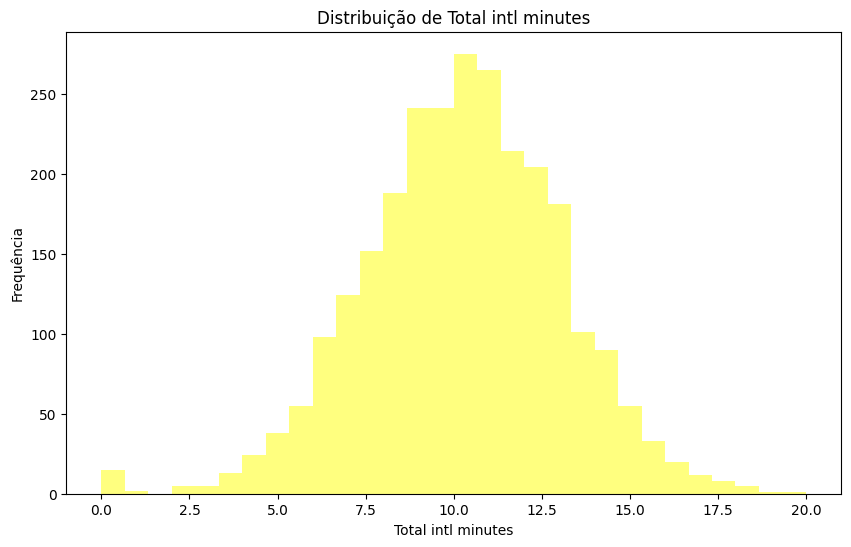

In [ ]:
print("Total intl minutes - Descrição Estatística")
print(df['Total intl minutes'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Total intl minutes'], bins=30, alpha=0.5, color='yellow')
plt.title('Distribuição de Total intl minutes')
plt.xlabel('Total intl minutes')
plt.ylabel('Frequência')
plt.show()

Podemos observar que a média do tempo total gasto em chamadas internacionais é de aproximadamente 10.24 minutos. A maioria dos clientes realiza entre 8.5 e 12.1 minutos de chamadas internacionais, indicando uma faixa relativamente concentrada de uso. Além disso, é notável que existe uma pequena parcela de clientes que não faz chamadas internacionais, o que é evidenciado por valores próximos a zero.

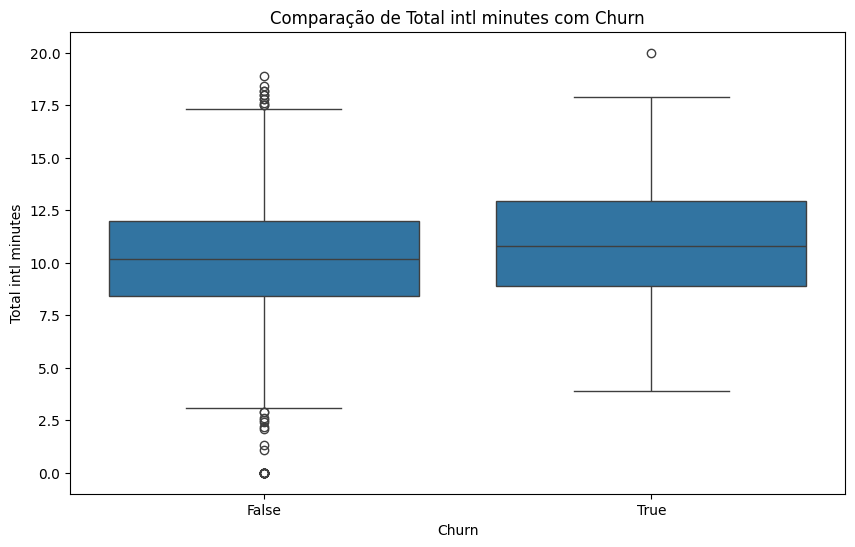

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Churn', y='Total intl minutes', data=df)
plt.title('Comparação de Total intl minutes com Churn')
plt.xlabel('Churn')
plt.ylabel('Total intl minutes')
plt.show()

Ao comparar o tempo total de chamadas internacionais com o churn, podemos observar que a mediana do tempo gasto é bastante similar para ambos os grupos, os que cancelaram o serviço (Churn = True) e os que não cancelaram (Churn = False). A faixa interquartil também é semelhante, indicando que a maioria dos clientes, independentemente do churn, gasta um tempo similar em chamadas internacionais.

Contudo, é notável a presença de outliers em ambos os grupos. No grupo que não cancelou o serviço, existem clientes que fizeram tanto chamadas internacionais muito curtas (próximas de 0 minutos) quanto chamadas significativamente longas (acima de 17.5 minutos). Já no grupo que cancelou, também há outliers, mas eles estão mais concentrados em chamadas longas.

Essa distribuição sugere que o tempo total de chamadas internacionais pode não ser um fator determinante para o churn, mas ainda assim, alguns clientes com padrões de uso extremos (muito baixo ou muito alto) podem estar mais propensos a cancelar o serviço.

In [ ]:
data = df['Total intl minutes']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 8.5, Q3: 12.1, IQR: 3.5999999999999996, Limite Inferior: 3.1000000000000005, Limite Superior: 17.5
Outliers: [20.0, 0.0, 17.6, 18.9, 0.0, 18.0, 0.0, 18.2, 0.0, 0.0, 1.3, 0.0, 0.0, 0.0, 2.2, 0.0, 17.9, 18.4, 17.8, 2.9, 3.1, 17.6, 2.6, 0.0, 0.0, 18.2, 0.0, 18.0, 1.1, 0.0, 0.0, 0.0, 2.1, 2.9, 2.4, 2.5, 17.8]


Muitos dos outliers identificados são 0.0, indicando que alguns clientes não utilizam o serviço de chamadas internacionais. O que pode ser analisado como clientes que não tem a necessidade de realizar chamadas internacionais.

A partir das análises do gráfico e dos outliers do último código, podemos ver clientes que fazem so mais intenso do serviço e que eles são os mais propensos a churn. Isso pode ser interessante para identificar um segmento de clientes que talvez precise de um plano especial ou de um melhor acompanhamento para evitar churn (cancelamento).

#### Conclusão

Para cada análise buscamos padrões que podem indicar uma relação entre as características em relação ao churn, que será nossa variável de saída.
Essa visualização nos ajudou a entender melhor sobre as características e obter um bom entendimento sobre elas e sobre o comportamento dos clientes

### Análise aprofundada variáveis menor correlação

> Iremos analisar algumas características que têm menor correlação com o churn. A ideia é avaliar somente algumas que podem gerar dúvidas na modelagem.

Vamos focar nas variáveis:

- Account length

#### Account length

> Essa coluna mostra a duração do relacionamento do cliente com o provedor de serviços de telecomunicações, medida em meses. Pode ser um indicador de fidelidade e satisfação do cliente.

Account length - Descrição Estatística
count    2666.000000
mean      100.620405
std        39.563974
min         1.000000
25%        73.000000
50%       100.000000
75%       127.000000
max       243.000000
Name: Account length, dtype: float64


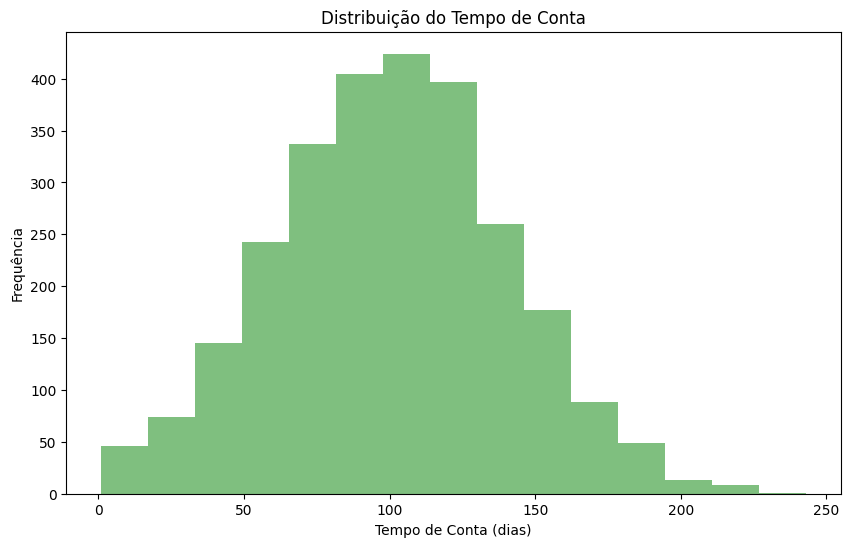

In [ ]:
print("Account length - Descrição Estatística")
print(df['Account length'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Account length'], bins=15, alpha=0.5, color='green')
plt.title('Distribuição do Tempo de Conta')
plt.xlabel('Tempo de Conta (dias)')
plt.ylabel('Frequência')
plt.show()

Podemos analisar que a média, combinada com o desvio padrão, sugere que há uma variação considerável no tempo de conta entre os clientes. A faixa de valores vai de 1 até 243 dias, o que mostra que alguns clientes são extremamente fiéis, enquanto outros cancelam rapidamente.

Analisando o histograma podemos observar que temos valores acima de 200, o que pode indicar clientes fiéis, mas são valores que podem ser considerados outliers e precisam ser analisados separadamente.

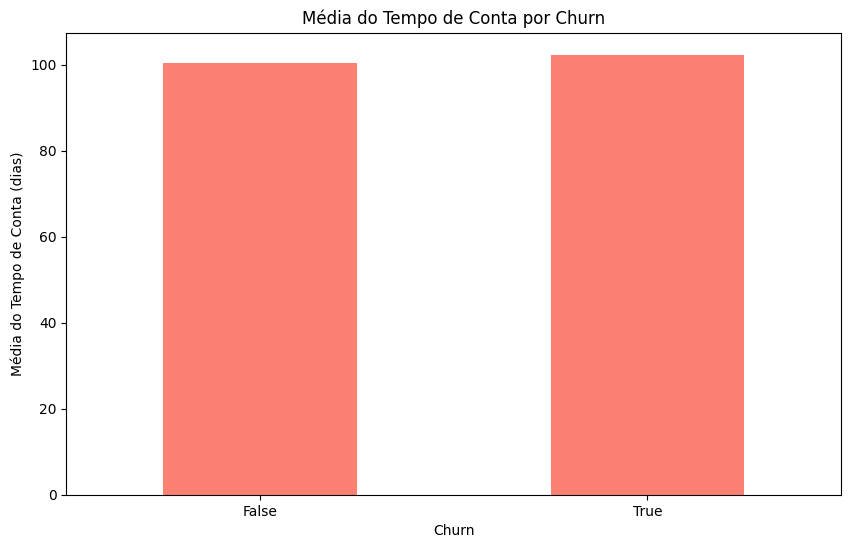

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Account length'].mean().plot(kind='bar', color='salmon')
plt.title('Média do Tempo de Conta por Churn')
plt.xlabel('Churn')
plt.ylabel('Média do Tempo de Conta (dias)')
plt.xticks(rotation=0)
plt.show()

Com base neste gráfico, o "Account length" não parece ser uma variável importante para explicar o churn. Como haviamos percebidos anteriormente com a matriz de correlação.

A média do tempo de conta é praticamente igual para os clientes que cancelaram o plano (True) e para aqueles que não cancelaram (False).

Mas foi obptada por essa avaliação para confirmar com gráficos.

In [ ]:
data = df['Account length']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 73.0, Q3: 127.0, IQR: 54.0, Limite Inferior: -8.0, Limite Superior: 208.0
Outliers: [209, 224, 243, 210, 212, 225, 225, 224, 212, 210, 217, 221]


Os outliers identificados indicam que há uma pequena proporção de clientes cujas contas estão ativas por um período significativamente maior do que a maioria dos clientes. Estes valores variam de 209 a 243 dias, o que sugere que alguns clientes têm uma conta por um período mais prolongado.

#### Total day calls

> O número total de chamadas diurnas feitas pelo cliente. Este recurso ajuda a analisar a frequência de chamadas durante o dia.

Total day calls - Descrição Estatística
count    2666.000000
mean      100.310203
std        19.988162
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       160.000000
Name: Total day calls, dtype: float64


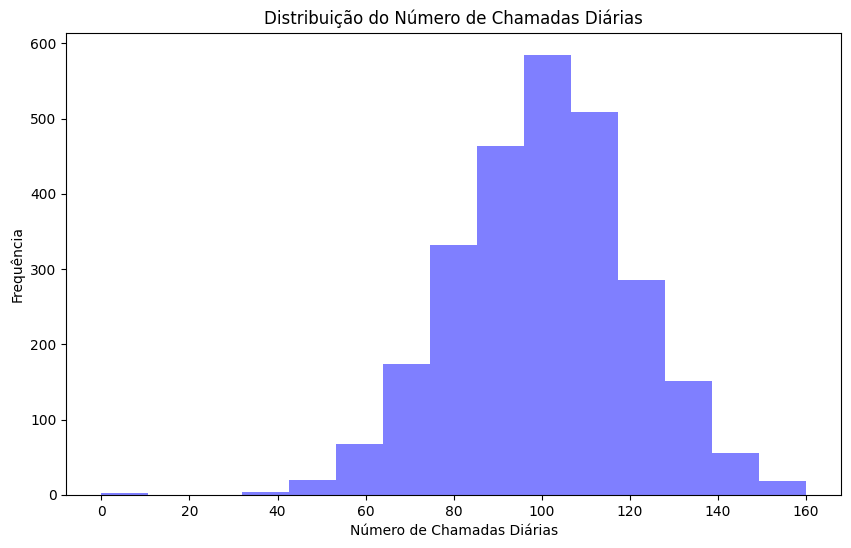

In [ ]:
print("Total day calls - Descrição Estatística")
print(df['Total day calls'].describe())

plt.figure(figsize=(10, 6))
plt.hist(df['Total day calls'], bins=15, alpha=0.5, color='blue')
plt.title('Distribuição do Número de Chamadas Diárias')
plt.xlabel('Número de Chamadas Diárias')
plt.ylabel('Frequência')
plt.show()

Podemos analisar que a média e a mediana estão bastante próximas (100,31 e 101), o que sugere que a distribuição de Total day calls é relativamente simétrica. maioria dos clientes realiza entre 87 e 114 chamadas por dia, o que pode ser considerado o intervalo de "atividade normal" para esses clientes.

O máximo de 160 chamadas não é um outlier extremo, mas ainda está significativamente acima da média. Pode ser útil investigar se esses clientes com números de chamadas muito elevados apresentam algum padrão específico (como maior probabilidade de churn ou reclamações).

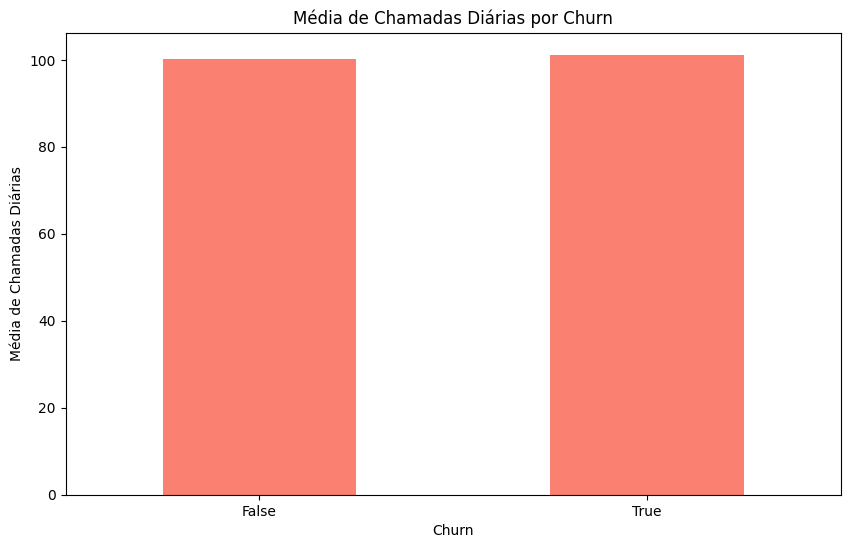

In [ ]:
plt.figure(figsize=(10, 6))
df.groupby('Churn')['Total day calls'].mean().plot(kind='bar', color='salmon')
plt.title('Média de Chamadas Diárias por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Chamadas Diárias')
plt.xticks(rotation=0)
plt.show()

A média de chamadas diárias para os clientes que realizaram churn é praticamente igual à média daqueles que não realizaram.
Esse resultado sugere que o número de chamadas diárias pode não ser um fator significativo para prever o churn.

In [ ]:
data = df['Total day calls']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 87.0, Q3: 114.0, IQR: 27.0, Limite Inferior: 46.5, Limite Superior: 154.5
Outliers: [158, 36, 40, 158, 42, 0, 45, 0, 45, 160, 156, 42, 158, 157, 45, 44, 44, 44]


Valores abaixo de 46.5 e acima de 154.5 são considerados outliers. A presença de outliers nessa coluna indica variações significativas no comportamento dos clientes.

#### Total eve minutes

> O número total de minutos usados ​​durante chamadas noturnas. Esse recurso é crucial para entender os padrões de uso durante horários de menor movimento.

Total eve minutes - Descrição Estatística
count    2666.000000
mean      200.386159
std        50.951515
min         0.000000
25%       165.300000
50%       200.900000
75%       235.100000
max       363.700000
Name: Total eve minutes, dtype: float64


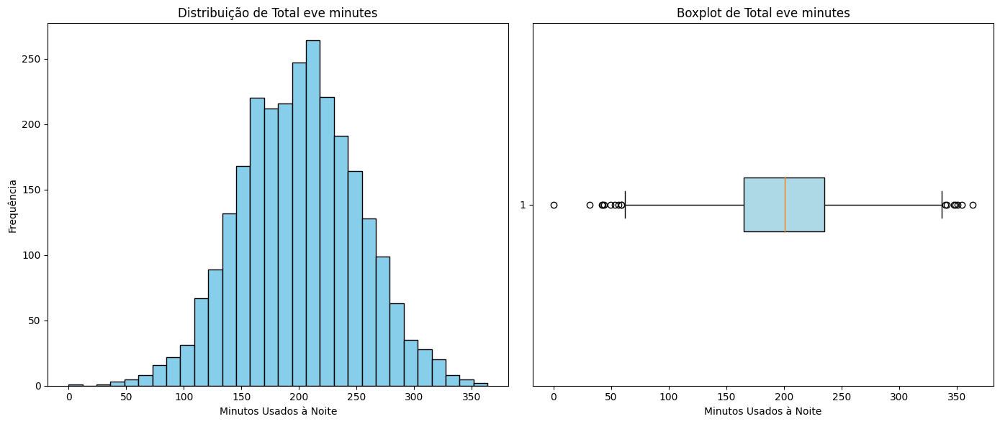

In [ ]:
print("Total eve minutes - Descrição Estatística")
print(df['Total eve minutes'].describe())

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist(df['Total eve minutes'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribuição de Total eve minutes')
plt.xlabel('Minutos Usados à Noite')
plt.ylabel('Frequência')

plt.subplot(1, 2, 2)
plt.boxplot(df['Total eve minutes'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot de Total eve minutes')
plt.xlabel('Minutos Usados à Noite')

plt.tight_layout()
plt.show()

Podemos analisar que a média de 200.39 minutos e a mediana de 200.90 minutos indicam que a distribuição da tabela é aproximadamente simétrica, com a maioria dos clientes utilizando cerca de 200 minutos durante o período da noite. O desvio padrão de 50.95 minutos mostra que há uma variação moderada no uso de minutos à noite entre os clientes.

A análise dos minutos utilizados durante a noite mostra uma distribuição  equilibrada, com a maioria dos clientes utilizando entre 165.30 e 235.10 minutos.

<ipython-input-205-bd8b4c5462d7>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total eve minutes', data=df, palette='OrRd')


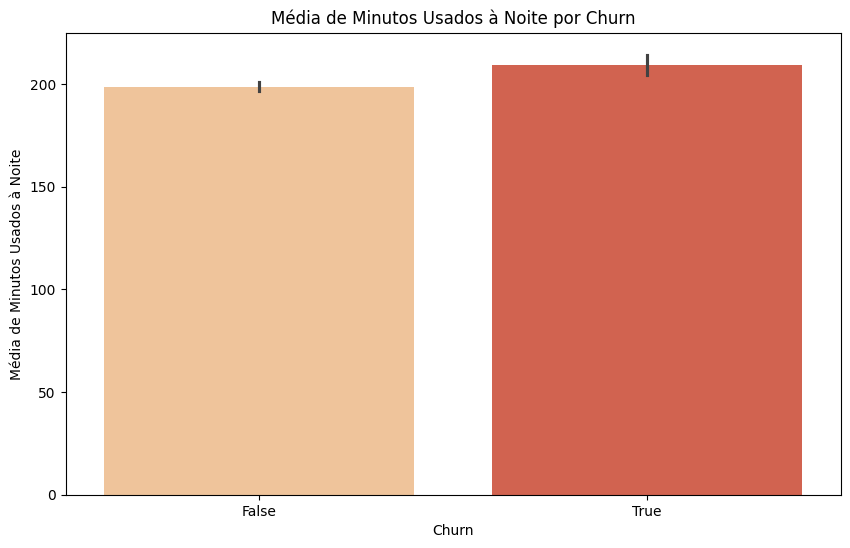

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Churn', y='Total eve minutes', data=df, palette='OrRd')
plt.title('Média de Minutos Usados à Noite por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Minutos Usados à Noite')
plt.xticks(rotation=0)
plt.show()

Clientes sem churn (False) têm uma média de uso noturno ligeiramente abaixo daqueles com churn (True). Clientes com churn tendem a utilizar mais minutos à noite, embora a diferença não seja muito grande.

In [ ]:
data = df['Total eve minutes']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 165.3, Q3: 235.1, IQR: 69.79999999999998, Limite Inferior: 60.60000000000004, Limite Superior: 339.79999999999995
Outliers: [348.5, 31.2, 42.2, 347.3, 58.9, 43.9, 52.9, 42.5, 58.6, 56.0, 350.9, 49.2, 339.9, 354.2, 363.7, 0.0, 341.3]


Valores como 348.5, 347.3, 350.9, e outros acima de 339.8 minutos indicam que alguns clientes estão utilizando um número muito alto de minutos durante a noite, bem acima do que a maioria dos outros clientes.

Esses valores representam usos extremos que podem ser importantes para entender o comportamento de churn. O uso muito baixo ou inexistente de minutos noturnos pode indicar que esses clientes têm padrões de uso diferentes, o que também pode ser relevante para entender seu comportamento e o potencial de churn.

#### Total eve calls

> O número total de chamadas noturnas feitas pelo cliente. Ele reflete a frequência de chamadas feitas à noite.

Total eve calls - Descrição Estatística
count    2666.000000
mean      100.023631
std        20.161445
min         0.000000
25%        87.000000
50%       100.000000
75%       114.000000
max       170.000000
Name: Total eve calls, dtype: float64


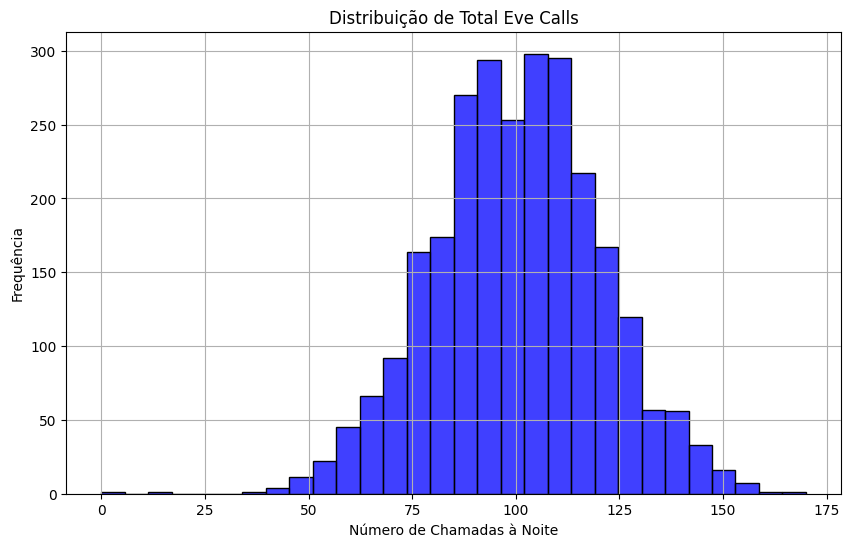

In [ ]:
print("Total eve calls - Descrição Estatística")
print(df['Total eve calls'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(df['Total eve calls'], kde=False, color='blue', bins=30)
plt.title('Distribuição de Total Eve Calls')
plt.xlabel('Número de Chamadas à Noite')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

Podemos analisar que temos uma coluna com distribuição aproximadamente normal, centrada em torno de 100 chamadas por noite, com a maior parte dos valores concentrados entre 87 e 114 chamadas. Isso indica que a maioria dos clientes tem um hábito de chamadas noturnas relativamente semelhantes.

<ipython-input-208-cc6ec881f964>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Churn', y='Total eve calls', data=df, palette='OrRd', ci=None)
<ipython-input-208-cc6ec881f964>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total eve calls', data=df, palette='OrRd', ci=None)


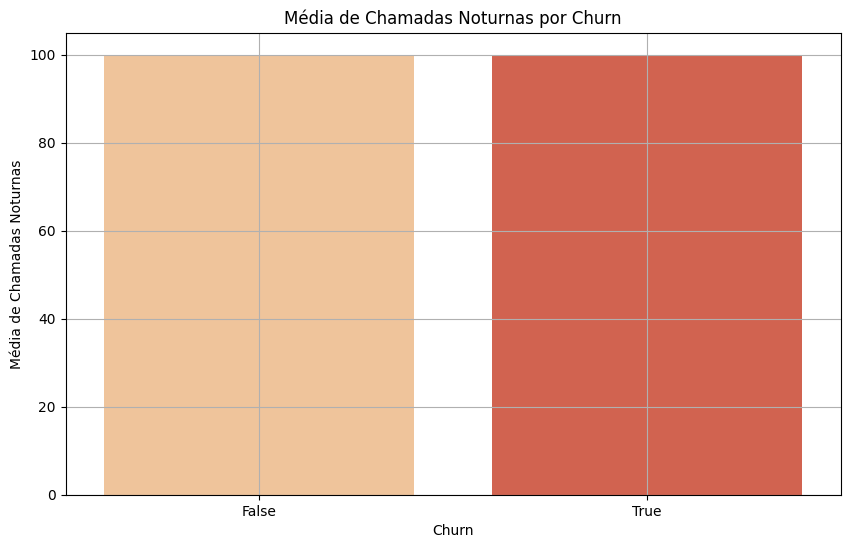

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Churn', y='Total eve calls', data=df, palette='OrRd', ci=None)
plt.title('Média de Chamadas Noturnas por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Chamadas Noturnas')
plt.grid(True)
plt.show()

Nesse gráfico que compara a média de chamadas noturnas entre os usuários que realizaram churn e os que não realizaram. Isso indica que o número de chamadas noturnas não tem um impacto significativo na probabilidade de churn. Em outras palavras, o comportamento de chamadas noturnas dos clientes que cancelam o serviço é muito similar ao daqueles que permanecem.

In [ ]:
data = df['Total eve calls']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 87.0, Q3: 114.0, IQR: 27.0, Limite Inferior: 46.5, Limite Superior: 154.5
Outliers: [46, 42, 12, 157, 45, 36, 156, 46, 44, 155, 43, 0, 155, 159, 170]


Os outliers identificados no conjunto de dados são os valores que estão fora do intervalo interquartil (IQR), ou seja, abaixo de 46.5 ou acima de 154.5 chamadas à noite.

Os valores mais baixos representam clientes que fazem menos chamadas à noite pode indicar clientes que não utilizam o serviço noturno de chamadas, o que pode ser relevante para o entendimento do comportamento do cliente

Os valores mais altos representam clientes que fazem um número mais alto de chamadas à noite. Esses clientes podem ter necessidades específicas de serviço.


#### Total eve charge

> O custo total para chamadas noturnas. Isso mostra o custo incorrido pelo cliente para uso noturno.

Total eve charge - Descrição Estatística
count    2666.000000
mean       17.033072
std         4.330864
min         0.000000
25%        14.050000
50%        17.080000
75%        19.980000
max        30.910000
Name: Total eve charge, dtype: float64


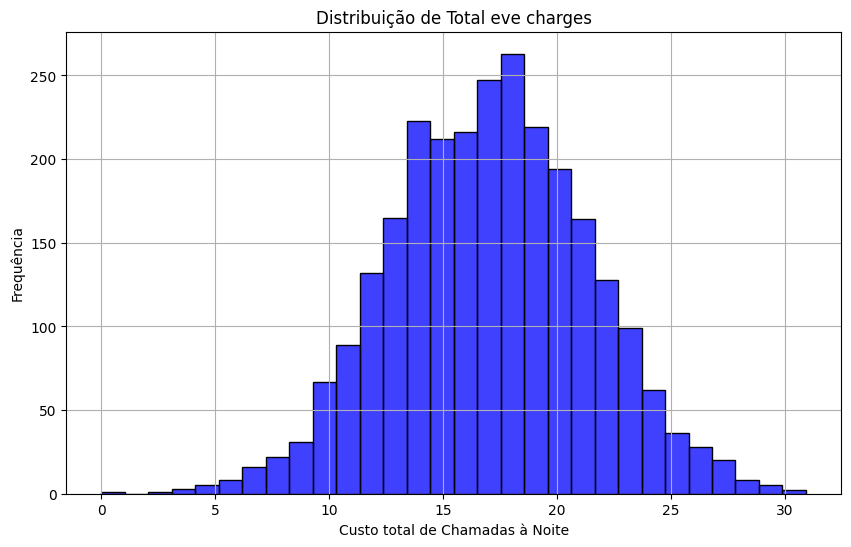

In [ ]:
print("Total eve charge - Descrição Estatística")
print(df['Total eve charge'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(df['Total eve charge'], kde=False, color='blue', bins=30)
plt.title('Distribuição de Total eve charges')
plt.xlabel('Custo total de Chamadas à Noite')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

Podemos observar que a mediana (17.08) está muito próxima da média (17.03), e o que mostra o gráfico é que a distribuição dos dados é relativamente simétrica. Onde 50% dos dados estão localizados entre 14.05 e 19.98. O desvio padrão de 4.33 indica que a maioria dos valores está próxima da média.

Temos alguns valores extremos que podem indicar outliers.

<ipython-input-211-44d45dae5338>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Churn', y='Total eve charge', data=df, ci=None, palette='RdGy')
<ipython-input-211-44d45dae5338>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total eve charge', data=df, ci=None, palette='RdGy')


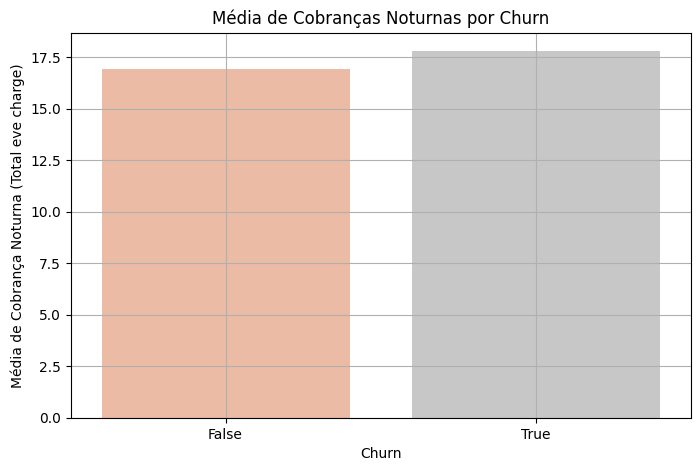

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Churn', y='Total eve charge', data=df, ci=None, palette='RdGy')
plt.title('Média de Cobranças Noturnas por Churn')
plt.xlabel('Churn')
plt.ylabel('Média de Cobrança Noturna (Total eve charge)')
plt.grid(True)
plt.show()

Esse gráfico compara o custo total para chamadas noturnas entre os usuários que realizaram churn e os que não realizaram. Ele indica que o custo total para chamadas noturnas tem um leve impacto na probabilidade de churn. As médias são muito próximas, indicando que, neste conjunto de dados, o custo total de chamadas noiturnas não tem uma correlação forte com o churn.

In [ ]:
data = df['Total eve charge']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 14.05, Q3: 19.98, IQR: 5.93, Limite Inferior: 5.155000000000001, Limite Superior: 28.875
Outliers: [29.62, 2.65, 3.59, 29.52, 5.01, 3.73, 4.5, 3.61, 4.98, 4.76, 29.83, 4.18, 28.89, 30.11, 30.91, 0.0, 29.01]


Os valores considerados outliers são aqueles que estão abaixo de 5.155 ou acima de 28.875, mas a maioria dos dados estão entre esses valores. O que significa que a maioria dos clientes tem um custo total noturno dentre desse intervalo.

#### Total night minutes

> O número total de minutos usados durante chamadas noturnas. O uso noturno costuma ser mais barato, então esse recurso é útil para análise de custos.

Total night minutes - Descrição Estatística
count    2666.000000
mean      201.168942
std        50.780323
min        43.700000
25%       166.925000
50%       201.150000
75%       236.475000
max       395.000000
Name: Total night minutes, dtype: float64


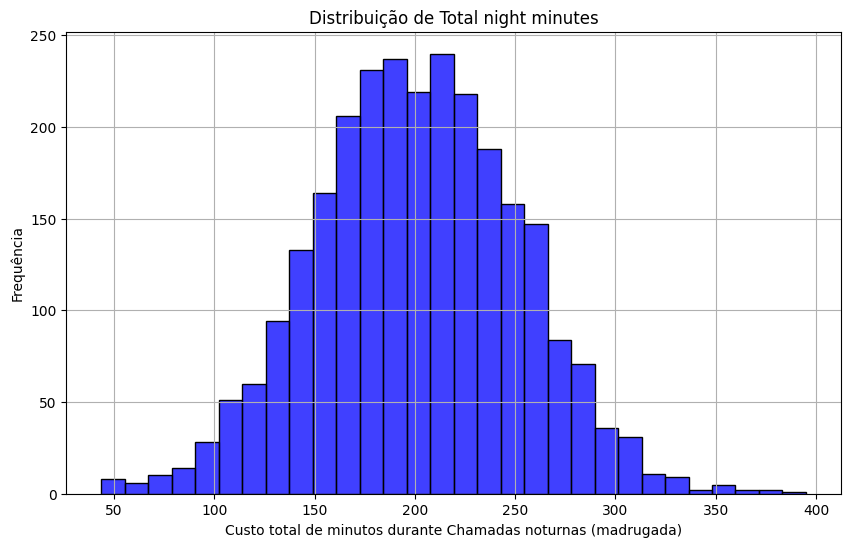

In [ ]:
print("Total night minutes - Descrição Estatística")
print(df['Total night minutes'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(df['Total night minutes'], kde=False, color='blue', bins=30)
plt.title('Distribuição de Total night minutes')
plt.xlabel('Custo total de minutos durante Chamadas noturnas (madrugada)')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

Podemos observar que a média de minutos usados à noite é de aproximadamente 201.17 minutos, o que sugere que, em média, os clientes utilizam pouco mais de 200 minutos de chamadas durante a noite.

O desvio padrão de 50.78 minutos indica uma variação razoável na quantidade de minutos utilizados pelos clientes.
Enquanto alguns clientes podem usar minutos próximos da média, alguns usam mais ou muito menos como podemos observar no gráfico.

<ipython-input-214-60bdb1f34985>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Churn', y='Total night minutes', data=df, ci=None, palette='RdGy')
<ipython-input-214-60bdb1f34985>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total night minutes', data=df, ci=None, palette='RdGy')


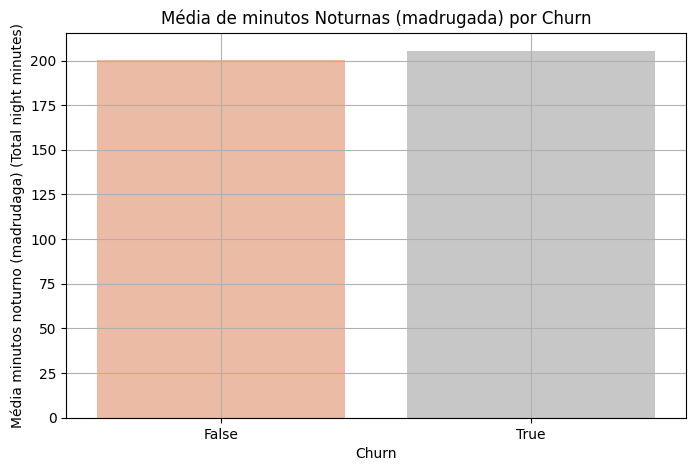

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Churn', y='Total night minutes', data=df, ci=None, palette='RdGy')
plt.title('Média de minutos Noturnas (madrugada) por Churn')
plt.xlabel('Churn')
plt.ylabel('Média minutos noturno (madrudaga) (Total night minutes)')
plt.grid(True)
plt.show()

Esse gráfico compara os minutos usados em chamadas noturnas entre os usuários que realizaram churn e os que não realizaram. Ele indica que os minutos usados em chamadas noturnas tem um leve impacto na probabilidade de churn. As médias são muito próximas, indicando que, neste conjunto de dados, os minutos usados em chamadas noturnas não tem uma correlação forte com o churn, mas ainda são um pouco mais relevantes para o churn.

In [ ]:
data = df['Total night minutes']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 166.925, Q3: 236.475, IQR: 69.54999999999998, Limite Inferior: 62.60000000000004, Limite Superior: 340.79999999999995
Outliers: [57.5, 354.9, 349.2, 45.0, 342.8, 364.3, 54.5, 50.1, 43.7, 352.5, 381.9, 377.5, 56.6, 54.0, 344.3, 395.0, 350.2, 50.1, 53.3, 352.2, 364.9, 47.4]


Os limites inferior e superior foram calculados usando o IQR. Valores abaixo de 62.60 minutos ou acima de 340.80 minutos são considerados outliers.

Foram identificados 22 outliers no conjunto de dados. Isso indica que esses valores estão significativamente fora do intervalo esperado, com alguns valores bem abaixo do limite inferior e outros bem acima do limite superior.

#### Total night calls

> O número total de chamadas noturnas feitas pelo cliente. Isso pode ajudar a analisar padrões de chamadas durante as horas noturnas

Total night calls - Descrição Estatística
count    2666.000000
mean      100.106152
std        19.418459
min        33.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       166.000000
Name: Total night calls, dtype: float64


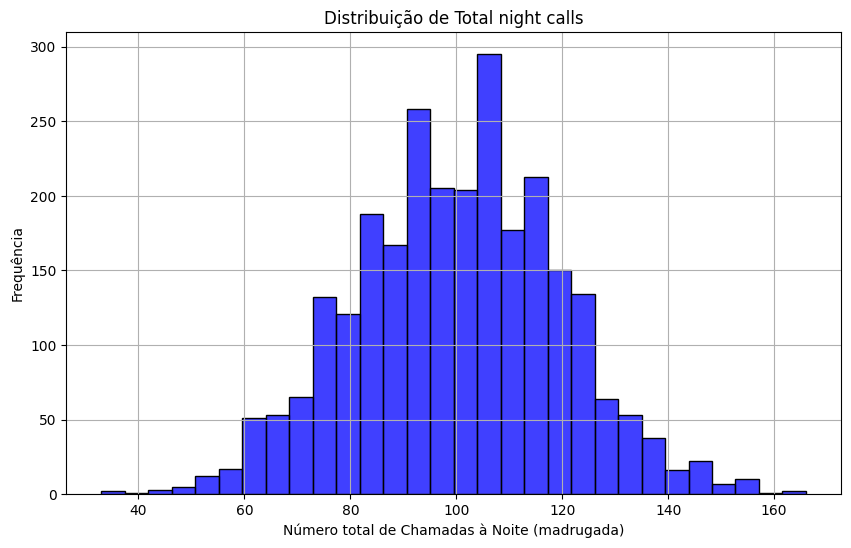

In [ ]:
print("Total night calls - Descrição Estatística")
print(df['Total night calls'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(df['Total night calls'], kde=False, color='blue', bins=30)
plt.title('Distribuição de Total night calls')
plt.xlabel('Número total de Chamadas à Noite (madrugada)')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

A média de chamadas à noite é 100.11, o que indica que, em média, os clientes fazem cerca de 100 chamadas durante o período noturno. O desvio padrão é de 19.42, o que mostra uma variação moderada no número de chamadas noturnas entre os clientes.

O número mínimo de chamadas à noite é 33, e o máximo é 166. Isso mostra que há uma ampla gama de comportamentos entre os clientes, com alguns fazendo muito poucas chamadas noturnas e outros fazendo um número relativamente alto

<ipython-input-217-9fa9da79dc67>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Churn', y='Total night calls', data=df, ci=None, palette='RdGy')
<ipython-input-217-9fa9da79dc67>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total night calls', data=df, ci=None, palette='RdGy')


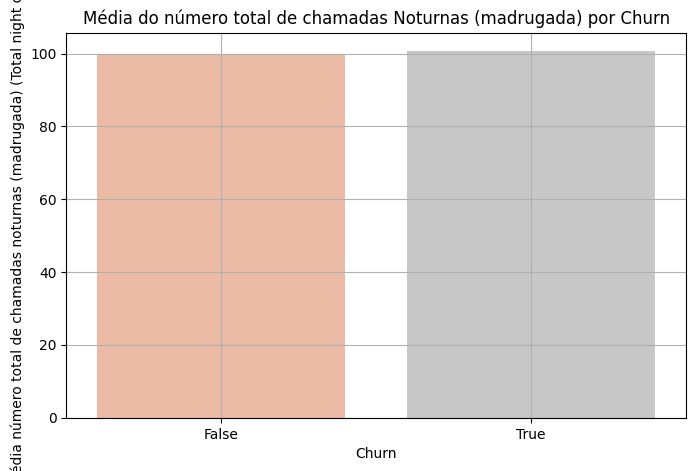

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Churn', y='Total night calls', data=df, ci=None, palette='RdGy')
plt.title('Média do número total de chamadas Noturnas (madrugada) por Churn')
plt.xlabel('Churn')
plt.ylabel('Média número total de chamadas noturnas (madrugada) (Total night calls)')
plt.grid(True)
plt.show()

Esse gráfico compara número total de chamadas noturnas entre os usuários que realizaram churn e os que não realizaram. Ele indica que o número total de chamadas noturnas não tem praticamente nenhum impacto na probabilidade de churn. As médias são muito próximas, indicando que, neste conjunto de dados, número total de chamadas noturnas não tem uma correlação forte com o churn, mas ainda pode ser relevante para o churn em conjunto com outras colunas.

In [ ]:
data = df['Total night calls']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 87.0, Q3: 113.0, IQR: 26.0, Limite Inferior: 48.0, Limite Superior: 152.0
Outliers: [46, 44, 42, 153, 154, 158, 157, 157, 154, 153, 166, 33, 155, 156, 38, 36, 156, 164, 153]


Qualquer valor abaixo de 48 chamadas ou acima de 152 chamadas é considerado um outlier. Isso indica que existe um grupo de clientes que realiza um número significativamente menor de chamadas à noite, assim como um grupo que realiza um número significativamente maior.


#### Total night charge

> O custo total para chamadas noturnas. Isso indica a despesa incorrida pelo cliente para uso noturno

Total night charge - Descrição Estatística
count    2666.000000
mean        9.052689
std         2.285120
min         1.970000
25%         7.512500
50%         9.050000
75%        10.640000
max        17.770000
Name: Total night charge, dtype: float64


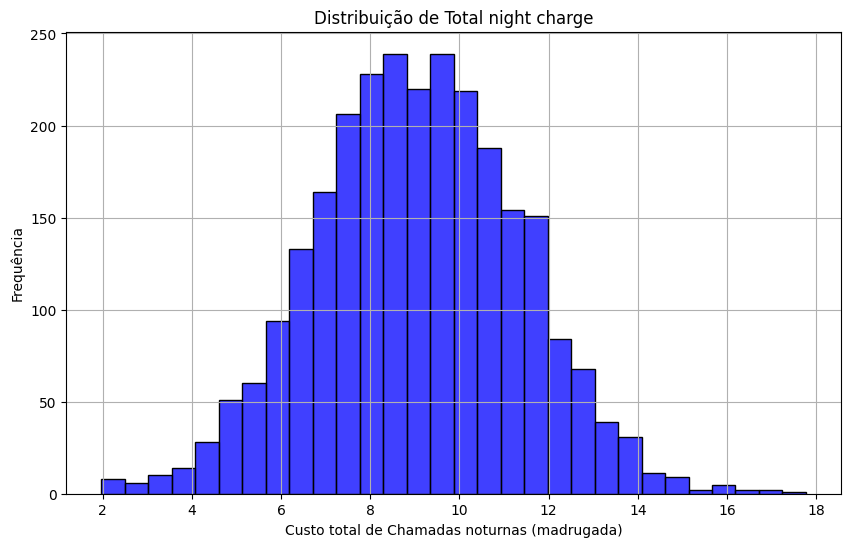

In [ ]:
print("Total night charge - Descrição Estatística")
print(df['Total night charge'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(df['Total night charge'], kde=False, color='blue', bins=30)
plt.title('Distribuição de Total night charge')
plt.xlabel('Custo total de Chamadas noturnas (madrugada)')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

A média dessa coluna é 9.05, indicando que, em média, os clientes pagam cerca de 9.05 pelas chamadas feitas durante a madrugada. E temos uma distribuição simétrica do valores como podemos observar.

A maioria dos clientes tem um custo de chamadas noturnas que está razoavelmente próximo da média, com algumas variações.

<ipython-input-220-a4093e4e712f>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Churn', y='Total night charge', data=df, ci=None, palette='RdGy')
<ipython-input-220-a4093e4e712f>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Churn', y='Total night charge', data=df, ci=None, palette='RdGy')


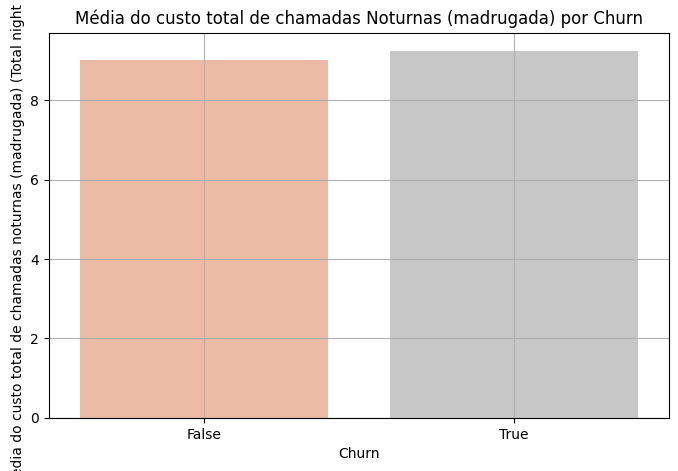

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Churn', y='Total night charge', data=df, ci=None, palette='RdGy')
plt.title('Média do custo total de chamadas Noturnas (madrugada) por Churn')
plt.xlabel('Churn')
plt.ylabel('Média do custo total de chamadas noturnas (madrugada) (Total night calls)')
plt.grid(True)
plt.show()

Esse gráfico compara o custo total de chamadas noturnas (madrugada) entre os usuários que realizaram churn e os que não realizaram. Ele indica que o custo total de chamadas noturnas não tem praticamente nenhum impacto na probabilidade de churn. As médias são muito próximas, indicando que, neste conjunto de dados, o custo total de chamadas noturnas na madrugada não tem uma correlação forte com o churn, mas ainda pode ser relevante para o churn em conjunto com outras colunas.

In [ ]:
data = df['Total night charge']

Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = [x for x in data if x < lower_bound or x > upper_bound]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}, Limite Inferior: {lower_bound}, Limite Superior: {upper_bound}")
print(f"Outliers: {outliers}")

Q1: 7.512499999999999, Q3: 10.64, IQR: 3.1275000000000013, Limite Inferior: 2.8212499999999974, Limite Superior: 15.331250000000002
Outliers: [2.59, 15.97, 15.71, 2.03, 15.43, 16.39, 2.45, 2.25, 1.97, 15.86, 17.19, 16.99, 2.55, 2.43, 15.49, 17.77, 15.76, 2.25, 2.4, 15.85, 16.42, 2.13]


Os valores abaixo de 2.82 que são o limite inferior, pode sugerir uso limitado durante o período da madrugada, entre os clientes, com um custo noturno muito baixo.
O valores acima de 15.33 que são o limite superior, indica o uso do serviço de chamadas nortunas de forma mais frequente e intensa, resultando em custo noturno muito alto.

#### Area code

> O código de área associado ao número de telefone do cliente. Isso é frequentemente usado para segmentar clientes geograficamente.

In [ ]:
df["Area code"].unique()

array([415, 408, 510])

Já observamos que Area code é uma característica categórica e não tem correlação significativa com o churn, indicando que não é uma característica relevante para prever o cancelamento, possuindo apenas três valores distintos.

# Preparação dos Dados

Chegamos na parte de preparação dos dados, aqui iremos preparar todas as características, inclusive as que não fizemos uma análise aprofundada. Pois iremos utilizar a maioria delas na modelagem.



## State

> iremos optar por retirar a State por sua nula correlação com churn e por ser uma coluna que não é boa para fazer normalização. Pois mesmo observando e analisando todas as possibilidades dela ter alguma interferencia em conjunto com outras colunas não conseguimos sentir confiança em manter ela. Achando assim que ela é desnecessária.

In [49]:
df = df.drop(["State"], axis=1)

## Account length

Optamos por não remover os outliers dessa coluna, assim como faremos com as outras colunas pois elas podem ser indicadores importantes de padrões de uso que levam ao churn.

> Para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler (caso optar por fazer limpeza colocar o Capped da nova coluna)

In [52]:
df['Account length'] = MinMaxScaler().fit_transform(df[['Account length']])

In [53]:
df['Account length']

,Account length
0,0.524793
1,0.438017
2,0.561983
3,0.342975
4,0.305785
...,...
2661,0.322314
2662,0.789256
2663,0.276860
2664,0.111570


## Area code

Nesse primeiro momento decidimos por manter essa coluna e fazer um tratamento usando One-Hot Encoding.


In [54]:
# Aplicando One-Hot Encoding na coluna 'AREA CODE'
df = pd.get_dummies(df, columns=["Area code"], prefix="AreaCode", drop_first=True)

# Convertendo as colunas geradas para o tipo inteiro (se necessário)
df[["AreaCode_415", "AreaCode_510"]] = df[["AreaCode_415", "AreaCode_510"]].astype(int)

A coluna original "Area code" será substituída por duas novas colunas, "AreaCode_415" e "AreaCode_510" e cada linha da base de dados terá 0 ou 1, indicando qual o código da área. Utilizamos o drop_first=True e o código da área 408 não será representado explicitamente, mas sim implicitamente, onde o valor das outras colunas for igual a 0.

## International plan

> Aqui iremos normalizar a variável categórica International plan com valores "No" e "Yes" para 0 e 1. Para gantantir que o modelo de aprendizado de máquina possa processar e aprender com essas variáveis de forma eficaz.


In [55]:
df['International plan'] = df['International plan'].replace({'No': 0, 'Yes': 1})

In [56]:
df['International plan']

,International plan
0,0
1,0
2,0
3,1
4,1
...,...
2661,0
2662,0
2663,0
2664,0


## Voice mail plan

> iremos fazer o mesmo com a variável Voice main plan, e iremos normaliza-la para valores 0 e 1. Para gantantir que o modelo de aprendizado de máquina possa processar e aprender com essas variáveis de forma eficaz.

In [57]:
df['Voice mail plan'] = df['Voice mail plan'].replace({'No': 0, 'Yes': 1})

In [58]:
df['Voice mail plan']

,Voice mail plan
0,1
1,1
2,0
3,0
4,0
...,...
2661,0
2662,1
2663,0
2664,0


## Number vmail messages

> Por essa coluna ter uma correlação significativa com o churn e que a maioria dos clientes que cancelam o plano utilizam o serviço de voicemail, optamos por não fazer a limpeza dos dados considerados outliers, pois eles podem ser indicadores importantes de padrões de uso que levam ao churn.

> Para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler (caso seja optado por fazer a limpeza de outliers, modificar o nome da coluna)

In [60]:
df['Number vmail messages'] = MinMaxScaler().fit_transform(df[['Account length']])

In [61]:
df['Number vmail messages']

,Number vmail messages
0,0.524793
1,0.438017
2,0.561983
3,0.342975
4,0.305785
...,...
2661,0.322314
2662,0.789256
2663,0.276860
2664,0.111570


## Total day minutes

Por essa coluna ter uma correlação significativa com o churn e que a maioria dos clientes que cancelam o plano utilizam o serviço de voicemail, optamos por não fazer a limpeza dos dados considerados outliers, pois eles podem ser indicadores importantes de padrões de uso que levam ao churn.

> Para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [62]:
df['Total day minutes'] = MinMaxScaler().fit_transform(df[['Total day minutes']])

In [63]:
df['Total day minutes']

,Total day minutes
0,0.755701
1,0.460661
2,0.693843
3,0.853478
4,0.475200
...,...
2661,0.383979
2662,0.445268
2663,0.658780
2664,0.515393


## Total day calls

Optamos por não remover os outliers dessa coluna, assim como faremos com as outras colunas pois elas podem ser indicadores importantes de padrões de uso que levam ao churn.

> Para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler (caso optar por fazer limpeza colocar o Capped da nova coluna)

In [65]:
df['Total day calls'] = MinMaxScaler().fit_transform(df[['Total day calls']])

In [66]:
df['Total day calls']

,Total day calls
0,0.68750
1,0.76875
2,0.71250
3,0.44375
4,0.70625
...,...
2661,0.61250
2662,0.48125
2663,0.35625
2664,0.68125


## Total day charge

Dado nosso objetivo principal de classificar churn e tendo em vista que os clientes onde estão os outliers podem ter uma alta correlação com churn mantê-los pode ser útil. Eles podem ser indicadores importantes de padrões de uso que levam ao churn.

> Para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [67]:
df['Total day charge'] = MinMaxScaler().fit_transform(df[['Total day charge']])

In [68]:
df['Total day charge']

,Total day charge
0,0.755701
1,0.460597
2,0.693830
3,0.853454
4,0.475184
...,...
2661,0.383970
2662,0.445171
2663,0.658786
2664,0.515426


## Total eve minutes

Como visto na análise exploratoria, considerando que tanto os outliers superiores quanto inferiores podem fornecer insights valiosos sobre comportamentos extremos que influenciam o churn, foi decidido não remover esses outliers de imediato.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [69]:
df['Total eve minutes'] = MinMaxScaler().fit_transform(df[['Total eve minutes']])

In [70]:
df['Total eve minutes']

,Total eve minutes
0,0.542755
1,0.537531
2,0.333242
3,0.170195
4,0.407754
...,...
2661,0.521584
2662,0.592521
2663,0.421776
2664,0.794061


## Total eve calls

Aqui também decidimos por não remover os outliers da nossa coluna inicialmente pois eles podem ser importantes para o entedimento do churn. Valores muito altos ou muito baixos podem representar diferentes razões para os clientes cancelarem o plano. O que pode influenciar diretamente a classificação do churn.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [71]:
df['Total eve calls'] = MinMaxScaler().fit_transform(df[['Total eve calls']])

In [72]:
df['Total eve calls']

,Total eve calls
0,0.582353
1,0.605882
2,0.647059
3,0.517647
4,0.717647
...,...
2661,0.400000
2662,0.741176
2663,0.323529
2664,0.341176


## Total eve charge

Optamos por não remover os outliers da nossa coluna inicialmente pois eles podem ser importantes para o entedimento do churn. Valores muito altos ou muito baixos podem representar diferentes razões para os clientes cancelarem o plano. O que pode influenciar diretamente a classificação do churn. Precisamos entender se o comportamento de clientes atípicos pode ter grande influencia.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [73]:
df['Total eve charge'] = MinMaxScaler().fit_transform(df[['Total eve charge']])

In [74]:
df['Total eve charge']

,Total eve charge
0,0.542866
1,0.537690
2,0.333225
3,0.170171
4,0.407959
...,...
2661,0.521514
2662,0.592688
2663,0.421870
2664,0.794241


## Total night minutes

Optamos por não remover os 22 outliers da nossa coluna inicialmente pois eles podem ser importantes para o entedimento do churn ou pelo menos não interferirem na nossa modelagem.

Valores muito altos ou muito baixos podem representar diferentes razões para os clientes cancelarem o plano. O que pode influenciar diretamente a classificação do churn. Precisamos entender se o comportamento de clientes atípicos pode ter grande influencia.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [75]:
df['Total night minutes'] = MinMaxScaler().fit_transform(df[['Total night minutes']])

In [76]:
df['Total night minutes']

,Total night minutes
0,0.572161
1,0.599772
2,0.338457
3,0.436095
4,0.407629
...,...
2661,0.505835
2662,0.670083
2663,0.420154
2664,0.421862


## Total night calls

Optamos por não remover os outliers da nossa coluna inicialmente pois eles podem ser importantes para o entedimento do churn.

Valores muito altos ou muito baixos podem representar diferentes razões para os clientes cancelarem o plano. O que pode influenciar diretamente a classificação do churn. Precisamos entender se o comportamento de clientes atípicos pode ter grande influencia.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [77]:
df['Total night calls'] = MinMaxScaler().fit_transform(df[['Total night calls']])

In [78]:
df['Total night calls']

,Total night calls
0,0.436090
1,0.526316
2,0.533835
3,0.421053
4,0.661654
...,...
2661,0.714286
2662,0.375940
2663,0.676692
2664,0.436090


## Total night charge

Optamos por manter os outliers da nossa coluna inicialmente pois eles podem ser importantes para o entedimento do churn.

Valores muito altos ou muito baixos podem representar diferentes razões para os clientes cancelarem o plano. O que pode influenciar diretamente a classificação do churn. Esses valores indicam comportamento real dos clientes e pode fornecer compreensões relevantes durante a modelagem.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [79]:
df['Total night charge'] = MinMaxScaler().fit_transform(df[['Total night charge']])

In [80]:
df['Total night charge']

,Total night charge
0,0.572152
1,0.600000
2,0.338608
3,0.436076
4,0.407595
...,...
2661,0.505696
2662,0.670253
2663,0.420253
2664,0.422152


## Total intl minutes

Iremos optar por manter os outliers nesse primeiro momento pois eles representam os comportamentos reais dos clientes, como os que não usam o serviço ou os que têm uso intenso, e podem revelar padrões e ajudar na identificação de churn.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [81]:
df['Total intl minutes'] = MinMaxScaler().fit_transform(df[['Total intl minutes']])

In [82]:
df['Total intl minutes']

,Total intl minutes
0,0.500
1,0.685
2,0.610
3,0.330
4,0.505
...,...
2661,0.590
2662,0.495
2663,0.480
2664,0.705


## Total intl calls

Optamos por não remover os outliers nessa coluna nesse primeiro momento porque esses dados podem ser mantidos para dividir os clientes em diferentes segmentos com suas devidas caracteristicas e observar quais os serviços específicos que cada grupo de clientes necessitam de acordo com o perfil de uso. Esses valores podem indicar comportamento real dos clientes e pode fornecer compreensões relevantes durante a modelagem.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler. A intenção é reduzir a influência de grandes valores e trazer os dados para uma escala comum.

In [83]:
df['Total intl calls'] = MinMaxScaler().fit_transform(df[['Total intl calls']])

In [84]:
df['Total intl calls']

,Total intl calls
0,0.15
1,0.15
2,0.25
3,0.35
4,0.15
...,...
2661,0.25
2662,0.30
2663,0.20
2664,0.30


## Total intl charge

Optamos por não remover os outliers nessa coluna inicialmente pois eles podem ser importantes para o entedimento do churn. Esses valores podem indicar comportamento real dos clientes e pode fornecer compreensões relevantes durante a modelagem.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler. A intenção é reduzir a influência de grandes valores e trazer os dados para uma escala comum.

In [85]:
df['Total intl charge'] = MinMaxScaler().fit_transform(df[['Total intl charge']])

In [86]:
df['Total intl charge']

,Total intl charge
0,0.500000
1,0.685185
2,0.609259
3,0.329630
4,0.505556
...,...
2661,0.590741
2662,0.494444
2663,0.479630
2664,0.705556


## Customer service calls

Manter os outliers é uma decisão incial considerando que eles representam valores que podem indicar comportamento real dos clientes diante do churn e pode fornecer compreensões relevantes durante a modelagem para o cancelamento do plano, já que chamadas frenquentes se revelam com maior número de churn.

> Mas para melhorar o desempenho do algoritmo quando chegarmos na modelagem, iremos normalizar os dados utilizando o MinMaxScaler

In [87]:
df['Customer service calls'] = MinMaxScaler().fit_transform(df[['Customer service calls']])

In [88]:
df['Customer service calls']

,Customer service calls
0,0.111111
1,0.111111
2,0.000000
3,0.222222
4,0.333333
...,...
2661,0.222222
2662,0.222222
2663,0.333333
2664,0.222222


## Churn


Nesse primeiro momento optamos por não fazer o balanceamento de classes, dado que na observação do pandas profiling observamos esse grande desbalanceamento. Iremos fazer a primeira modelagem sem esse tratamento e verificar sua resposta aos modelos e caso necessário voltaremos a parte de tratamento e faremos o balanceamento.

> Mas nesse momento iremos transformar os valores de True e False para 1 e 0. Mesmo entendendo que os modelos conseguem lidar com valores booleanos já transformando eles em zeros e ums, deixaremos explícito para termos mais controle sobre a codificação.

In [89]:
df['Churn'] = df['Churn'].astype(int)

In [90]:
df['Churn']

,Churn
0,0
1,0
2,0
3,0
4,0
...,...
2661,0
2662,0
2663,0
2664,0


> Nesse segundo momento iremos fazer o balanceamento de classe, dado um grande número de erros na matriz de confusão dos modelos. Sua acurácia pode ter gerado um falso positivo. Por este motivo iremos fazer uma redução da classe majoritária, pegando um número randomico dela e a tornando o mesmo tamanho da classe minoritária.

In [91]:
# Antes do balanceamento
print('Distribuição original:', Counter(y_train))

Distribuição original: Counter({False: 1595, True: 271})


In [113]:
rus = RandomUnderSampler(random_state=42)

X_res, y_res = rus.fit_resample(X_train, y_train)

# Após o balanceamento
print('Distribuição após undersampling:', Counter(y_res))

Distribuição após undersampling: Counter({0: 271, 1: 271})


Inicialmente tínhamos uma desproporção na classe de churn, onde havia muito mais valores na classe 0 (não churn) em comparação com a classe 1 (churn). Então foi utilizada a técnica Undersampling para ajustar essa desproporção da classe, como resultado o número da classe majoritária foi reduzido até ficar com o mesmo valor da minoritária.

Esse balanceamento foi feito depois da divisão dos dados para treinamento e testes.

# Modelagem

> Dividindo os valores de treinamento e teste

In [96]:
X = df.drop('Churn', axis=1)
y = df['Churn']

# Dividindo os dados em conjuntos de treino e teste (70% treino, 30% teste)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## Modelagem sem balanceamento

### Regressão Logística

In [97]:
log_reg = LogisticRegression(random_state=42)

log_reg.fit(X_train, y_train)

y_predicted = log_reg.predict(X_train)
accuracy = accuracy_score(y_train,y_predicted)
conf_matrix = confusion_matrix(y_train,y_predicted)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

y_predicted = log_reg.predict(X_test)
accuracy = accuracy_score(y_test,y_predicted)
conf_matrix = confusion_matrix(y_test,y_predicted)

print("Métricas de Testes")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

Métricas de Treinamento
Acurácia =  0.8606645230439443

Matriz de Confusão
[[1559   36]
 [ 224   47]]
Métricas de Testes
Acurácia =  0.8675

Matriz de Confusão
[[672  11]
 [ 95  22]]


O modelo tende a prever a classe 0 com mais frequência, o que pode ser devido ao desequilíbrio de classes (mais exemplos de 0 do que de 1).

#### Ajuste de hiperparâmetros com Regressão Logística

Iremos fazer o ajuste de hiperparâmetros nessa primeira modelagem para perceber se existe alguma forma de melhorar nossas métricas. Caso não tenha nenhum ganho significativo nesse ajuste e os próximos modelos não tenham bom desempenho, iremos voltar para fazer um balanceamanto de classes.

Ajustamos os parâmentros:

'C' que é a regularização para evitar o sobreajuste (overfitting) do modelo. Valores maiores permitem que o modelo se ajuste mais aos dados.

'penalty' que refere-se ao tipo de regularização que será aplicada ao modelo. l1 (Lasso) tende a resultar em modelos mais esparsos, onde alguns coeficientes podem ser zero, o que pode ser útil para seleção de características. l2 (Ridge) distribui a penalidade entre todos os coeficientes, mantendo todos eles, mas os empurrando para valores menores.

e 'solver' que refere-se ao algoritmo usado para otimizar a função de custo da Regressão Logística. liblinear é adequado para conjuntos de dados menores e é compatível com penalidades l1 e l2, enquanto lbfgs é mais eficiente para conjuntos de dados maiores e é geralmente usado com l2.

In [98]:
# Defina a grade de hiperparâmetros
param_grid = {'C': np.logspace(-5, 8, 15), 'penalty': ['l1', 'l2'], 'solver': ['liblinear', 'lbfgs']}

logit = LogisticRegression()

logit_cv = GridSearchCV(logit, param_grid, cv=5, scoring='accuracy')

logit_cv.fit(X_train, y_train)

# Vericando os melhores parâmetros e a melhor acurácia
print("Melhores Parâmetros: {}".format(logit_cv.best_params_))
print("Melhor Acurácia: {}".format(logit_cv.best_score_))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Melhores Parâmetros: {'C': 31.622776601683793, 'penalty': 'l1', 'solver': 'liblinear'}
Melhor Acurácia: 0.8622700749810038


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
75 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
75 fits failed with the following error:
Traceb

Resultados:

Melhores Parâmetros: {'C': 31.622776601683793, 'penalty': 'l2', 'solver': 'liblinear'}

Melhor Acurácia: 0.8617353156227152

O valor da acurácia encontrado é muito próximo da acurácia do modelo original (86.75%), sugerindo que a escolha de hiperparâmetros iniciais já estava razoavelmente bem ajustada.

Podemos analisar que a capacidade do modelo prever o churn é baixa, pois sua capacidade de prever a classe 1 é limitada. O ajuste dos hiperparametros não trouxe nenhum ganho significativo.

### Random Forest

In [99]:
rf_model = RandomForestClassifier()

rf_model.fit(X_train, y_train)

y_predicted = rf_model.predict(X_train)
accuracy = accuracy_score(y_train,y_predicted)
conf_matrix = confusion_matrix(y_train,y_predicted)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

y_predicted = rf_model.predict(X_test)
accuracy = accuracy_score(y_test,y_predicted)
conf_matrix = confusion_matrix(y_test,y_predicted)

print("Métricas de Testes")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

Métricas de Treinamento
Acurácia =  1.0

Matriz de Confusão
[[1595    0]
 [   0  271]]
Métricas de Testes
Acurácia =  0.94375

Matriz de Confusão
[[683   0]
 [ 45  72]]


Perfeito nos dados de treinamento, indicando possível overfitting, pois o modelo tem bom desempenho no geral mas ainda erra muito na classe minoritária (churn).

#### Cross-Validation com Radom Forest não balanceado


In [100]:
# Aplicando cross-validation com 5 folds na base original
cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')

print("Acurácia em cada fold (não balanceada): ", cv_scores)
print("Acurácia média (não balanceada): ", cv_scores.mean())
print("Desvio padrão das acurácias (não balanceada): ", cv_scores.std())

y_pred_cv = cross_val_predict(rf_model, X_train, y_train, cv=5)
print("Relatório de Classificação (não balanceada):")
print(classification_report(y_train, y_pred_cv))

Acurácia em cada fold (não balanceada):  [0.94652406 0.9383378  0.95710456 0.95174263 0.93565684]
Acurácia média (não balanceada):  0.9458731774454847
Desvio padrão das acurácias (não balanceada):  0.008027122882641914
Relatório de Classificação (não balanceada):
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1595
           1       0.92      0.68      0.78       271

    accuracy                           0.94      1866
   macro avg       0.93      0.83      0.87      1866
weighted avg       0.94      0.94      0.94      1866



Analisando a validação cruzada com os dados não balanceados tivemos uma acurária média de aproximadamente 94% e um baixo desvio padrão, mas a precisão de recall é alta para a classe majoritária e bem inferior para a minoritária, continuando mostrando que o modelo ainda não captura bem os dados de churn. Isso mostra uma negligencia na nossa classe de interesse e um superajuste no modelo, com acurácia alta e muitos erros na classificação de churn.

### Gradient Boosting Machines (GBM)

In [101]:
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)

y_pred_train = gb_model.predict(X_train)
accuracy_train = accuracy_score(y_train, y_pred_train)
conf_matrix_train = confusion_matrix(y_train, y_pred_train)

print("Métricas de Treinamento")
print("Acurácia = ", accuracy_train)
print("\nMatriz de Confusão")
print(conf_matrix_train)

y_pred_test = gb_model.predict(X_test)
accuracy_test = accuracy_score(y_test, y_pred_test)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

print("Métricas de Testes")
print("Acurácia = ", accuracy_test)
print("\nMatriz de Confusão")
print(conf_matrix_test)

Métricas de Treinamento
Acurácia =  0.9769560557341908

Matriz de Confusão
[[1594    1]
 [  42  229]]
Métricas de Testes
Acurácia =  0.94875

Matriz de Confusão
[[680   3]
 [ 38  79]]


Bom resultado no treinamnento, com alguns erros na classe minoritaria. E semelhante ao random forest, o modelo tem dificuldades em classificar a classe minoritária, gerando falsos negativos, onde classfica clientes que deram churn como que não deram churn.
Mesmo superajustado possui uma boa generalização para a classificação de churn.

### Support Vector Machine (SVM)

In [102]:
svm_model = SVC()

svm_model.fit(X_train, y_train)

y_predicted = svm_model.predict(X_train)
accuracy = accuracy_score(y_train,y_predicted)
conf_matrix = confusion_matrix(y_train,y_predicted)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

y_predicted = svm_model.predict(X_test)
accuracy = accuracy_score(y_test,y_predicted)
conf_matrix = confusion_matrix(y_test,y_predicted)

print("Métricas de Testes")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

Métricas de Treinamento
Acurácia =  0.9008574490889604

Matriz de Confusão
[[1589    6]
 [ 179   92]]
Métricas de Testes
Acurácia =  0.88375

Matriz de Confusão
[[680   3]
 [ 90  27]]


Boa acurácia no treinamento, mas com muitos erros na classe minoritária novamente. E no teste continua com dificuldades na classe minoritária.

A acurácia é realativamente alta, mas tem uma baixa de acertos nos clientes que deram churn, tendo muitos falsos negativos.

### KNN

In [103]:
knn_model = KNeighborsClassifier()

knn_model.fit(X_train, y_train)

y_predicted = knn_model.predict(X_train)
accuracy = accuracy_score(y_train,y_predicted)
conf_matrix = confusion_matrix(y_train,y_predicted)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

y_predicted = knn_model.predict(X_test)
accuracy = accuracy_score(y_test,y_predicted)
conf_matrix = confusion_matrix(y_test,y_predicted)

print("Métricas de Testes")
print("Acurácia = ",accuracy)
print("\nMatriz de Confusão")
print(conf_matrix)

Métricas de Treinamento
Acurácia =  0.9067524115755627

Matriz de Confusão
[[1569   26]
 [ 148  123]]
Métricas de Testes
Acurácia =  0.88375

Matriz de Confusão
[[672  11]
 [ 82  35]]


Novamente uma acurácia boa, mas com muitos erros na classe minoritária. E assim como os outros modelos o KNN tem problemas em prever a classe minoritária.

### Conclusão sem balanceamento de classes

Todos os modelos tem uma acurária boa, mas eles erram muito na classificação dos clientes que deram churn, classficando-os como não churn, o que podemos ver bastante na matriz de confusão. Por esse motivo o balanceamento de classes é claramente necessário, para conseguir prever a classe minoritária com mais sucesso.

## Modelagem com balanceamneto

### Regressão Logística

In [104]:
# Após o balanceamento
print('Distribuição após undersampling:', Counter(y_res))

Distribuição após undersampling: Counter({0: 271, 1: 271})


In [105]:
log_reg_under = LogisticRegression(random_state=42)

log_reg_under.fit(X_res, y_res)

y_predicted_under_train = log_reg_under.predict(X_res)
accuracy_under_train = accuracy_score(y_res, y_predicted_under_train)
conf_matrix_under_train = confusion_matrix(y_res, y_predicted_under_train)

print("Métricas de Treinamento")
print("Acurácia = ", accuracy_under_train)
print("\nMatriz de Confusão")
print(conf_matrix_under_train)

y_predicted_under_test = log_reg_under.predict(X_test)
accuracy_under_test = accuracy_score(y_test, y_predicted_under_test)
conf_matrix_under_test = confusion_matrix(y_test, y_predicted_under_test)

print("Métricas de Testes")
print("Acurácia = ", accuracy_under_test)
print("\nMatriz de Confusão")
print(conf_matrix_under_test)

Métricas de Treinamento
Acurácia =  0.7841328413284133

Matriz de Confusão
[[213  58]
 [ 59 212]]
Métricas de Testes
Acurácia =  0.75625

Matriz de Confusão
[[528 155]
 [ 40  77]]


Sem o balanceamento a acurácia se apresenta mais alta, porém ela não é boa para detectar a classe minoritária. Com o balanceamento a acurácia diminui, mas melhora na detecção da classe 1. Tornando o modelo mais equilibrado para prever o churn.

E talvez seja melhor priorizar uma alta detecção da classe minoritária, do que uma alta acurácia. Assim o modelo se torna mais útil para a detecção de churn, que é o objetivo do negócio.

#### Ajuste de hiperparâmetros com Regressão Logística

In [106]:
# Defina a grade de hiperparâmetros
param_grid_under = [
    {'C': np.logspace(-5, 8, 15), 'penalty': ['l1'], 'solver': ['liblinear']},
    {'C': np.logspace(-5, 8, 15), 'penalty': ['l2'], 'solver': ['lbfgs']}
]

logit_under = LogisticRegression()

logit_cv_under = GridSearchCV(logit_under, param_grid_under, cv=5, scoring='accuracy')

logit_cv_under.fit(X_res, y_res)

print("Melhores Parâmetros: {}".format(logit_cv_under.best_params_))
print("Melhor Acurácia: {}".format(logit_cv_under.best_score_))

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Melhores Parâmetros: {'C': 0.4393970560760795, 'penalty': 'l2', 'solver': 'lbfgs'}
Melhor Acurácia: 0.773054706082229


Resultados:

Melhores Parâmetros: {'C': 0.4393970560760795, 'penalty': 'l2', 'solver': 'lbfgs'}

Melhor Acurácia: 0.773054706082229

### Random Forest

In [107]:
rf_model_under = RandomForestClassifier()

rf_model_under.fit(X_res, y_res)

y_predicted_under = rf_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

y_predicted_under = rf_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Testes")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

Métricas de Treinamento
Acurácia =  1.0

Matriz de Confusão
[[271   0]
 [  0 271]]
Métricas de Testes
Acurácia =  1.0

Matriz de Confusão
[[271   0]
 [  0 271]]


No modelo sem balanceamento ele tem uma boa acurácia, mas mostra sofrer um leve overfitting.

No modelo com balanceamento a acurácia e matriz de confusão foram perfeitas, o que pode mostrar que o modelo se ajustou bem aos dados e generalizará bem para novos dados ou que sofreu um extremo overffiting, "memorizando" os dados de treinamento balanceados. E em cenários reais esse desempenho pode não se sustentar, já que os dados não são balanceados.

#### Cross-Validation Random Forest com balanceamento


In [114]:
cv_scores_under = cross_val_score(rf_model_under, X_res, y_res, cv=5, scoring='accuracy')

print("Acurácia em cada fold (balanceada): ", cv_scores_under)
print("Acurácia média (balanceada): ", cv_scores_under.mean())
print("Desvio padrão das acurácias (balanceada): ", cv_scores_under.std())

y_pred_cv_under = cross_val_predict(rf_model_under, X_res, y_res, cv=5)
print("Relatório de Classificação (balanceada):")
print(classification_report(y_res, y_pred_cv_under))

conf_matrix_rf_under = confusion_matrix(y_res, y_pred_cv_under)
print("\nMatriz de Confusão:")
print(conf_matrix_rf_under)

Acurácia em cada fold (balanceada):  [0.87155963 0.87155963 0.81481481 0.89814815 0.84259259]
Acurácia média (balanceada):  0.8597349643221202
Desvio padrão das acurácias (balanceada):  0.02851981420665028
Relatório de Classificação (balanceada):
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       271
           1       0.85      0.85      0.85       271

    accuracy                           0.85       542
   macro avg       0.85      0.85      0.85       542
weighted avg       0.85      0.85      0.85       542


Matriz de Confusão:
[[231  40]
 [ 40 231]]


Analisando a validação cruzada com os dados balanceados ele possui uma acurácia média de 85% e um desvio padrão de 2%, e ambas as classes possui precisão e recall equilibrados, indicando uma vantagem maior no modelo balanceado.
Mesmo com a acurácia geral diminuindo, o modelo se torna mais robusto por conseguir acertar mais a classe minoritária e classificar melhor o churn que é o objetivo do negócio.

### Gradient Boosting Machines (GBM)

In [109]:
gb_model_under = GradientBoostingClassifier()
gb_model_under.fit(X_res, y_res)

y_pred_train_under = gb_model_under.predict(X_res)
accuracy_train_under = accuracy_score(y_res, y_pred_train_under)
conf_matrix_train_under = confusion_matrix(y_res, y_pred_train_under)

print("Métricas de Treinamento")
print("Acurácia = ", accuracy_train_under)
print("\nMatriz de Confusão")
print(conf_matrix_train_under)

y_pred_test_under = gb_model_under.predict(X_res)
accuracy_test_under = accuracy_score(y_res, y_pred_test_under)
conf_matrix_test_under = confusion_matrix(y_res, y_pred_test_under)

print("Métricas de Testes")
print("Acurácia = ", accuracy_test_under)
print("\nMatriz de Confusão")
print(conf_matrix_test_under)

Métricas de Treinamento
Acurácia =  0.966789667896679

Matriz de Confusão
[[270   1]
 [ 17 254]]
Métricas de Testes
Acurácia =  0.966789667896679

Matriz de Confusão
[[270   1]
 [ 17 254]]


A acurácia é bastante alta e consistente tanto no treinamento quanto no teste, e aqui faz um trabalho melhor em reconhecer os clientes que deram churn na classe minoritária, reduzindo consideravelmente os falsos negativos. O que é melhor para o nosso objetivo de identificar churn. Portanto para nosso objetivo esse modelo com balanceamento é melhor que o sem balanceamento.

#### Cross-Validation GBM com balanceamento

In [110]:
cv_scores_gb_under = cross_val_score(gb_model_under, X_res, y_res, cv=5, scoring='accuracy')

print("Acurácia em cada fold (balanceada): ", cv_scores_gb_under)
print("Acurácia média (balanceada): ", cv_scores_gb_under.mean())
print("Desvio padrão das acurácias (balanceada): ", cv_scores_gb_under.std())

y_pred_cv_gb_under = cross_val_predict(gb_model_under, X_res, y_res, cv=5)

print("Relatório de Classificação (balanceada):")
print(classification_report(y_res, y_pred_cv_gb_under))

conf_matrix_gb_under = confusion_matrix(y_res, y_pred_cv_gb_under)
print("\nMatriz de Confusão:")
print(conf_matrix_gb_under)

Acurácia em cada fold (balanceada):  [0.83486239 0.88073394 0.87037037 0.88888889 0.85185185]
Acurácia média (balanceada):  0.8653414882772681
Desvio padrão das acurácias (balanceada):  0.01963488457374813
Relatório de Classificação (balanceada):
              precision    recall  f1-score   support

           0       0.85      0.88      0.87       271
           1       0.88      0.85      0.86       271

    accuracy                           0.86       542
   macro avg       0.86      0.86      0.86       542
weighted avg       0.86      0.86      0.86       542


Matriz de Confusão:
[[239  32]
 [ 42 229]]


### Support Vector Machine (SVM)

In [111]:
svm_model_under = SVC()

svm_model_under.fit(X_res, y_res)

y_predicted_under = svm_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

y_predicted_under = svm_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Testes")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

Métricas de Treinamento
Acurácia =  0.8302583025830258

Matriz de Confusão
[[225  46]
 [ 46 225]]
Métricas de Testes
Acurácia =  0.8302583025830258

Matriz de Confusão
[[225  46]
 [ 46 225]]


A acurácia diminui em um geral no modelo balanceado, mas apresenta uma melhor precisão na classificação da classe minoritária que são os clientes que deram churn. Portanto para o nosso modelo é recomendavel usar o modelo balanceado em comparação com o não balanceado, onde ele acerta mais a classe 1, já que o objetivo do negócio é classificar o churn.

#### Cross-Validation SVM com balanceamento

In [115]:
cv_scores_svm_under = cross_val_score(svm_model_under, X_res, y_res, cv=5, scoring='accuracy')

print("Acurácia em cada fold (balanceada): ", cv_scores_svm_under)
print("Acurácia média (balanceada): ", cv_scores_svm_under.mean())
print("Desvio padrão das acurácias (balanceada): ", cv_scores_svm_under.std())

y_pred_cv_svm_under = cross_val_predict(svm_model_under, X_res, y_res, cv=5)

print("Relatório de Classificação (balanceada):")
print(classification_report(y_res, y_pred_cv_svm_under))

conf_matrix_svm_under = confusion_matrix(y_res, y_pred_cv_svm_under)
print("\nMatriz de Confusão:")
print(conf_matrix_svm_under)

Acurácia em cada fold (balanceada):  [0.74311927 0.83486239 0.73148148 0.83333333 0.80555556]
Acurácia média (balanceada):  0.7896704043493035
Desvio padrão das acurácias (balanceada):  0.044168005980514145
Relatório de Classificação (balanceada):
              precision    recall  f1-score   support

           0       0.78      0.81      0.79       271
           1       0.80      0.77      0.79       271

    accuracy                           0.79       542
   macro avg       0.79      0.79      0.79       542
weighted avg       0.79      0.79      0.79       542


Matriz de Confusão:
[[219  52]
 [ 62 209]]


### KNN

In [112]:
knn_model_under = KNeighborsClassifier()
knn_model_under.fit(X_res, y_res)

y_predicted_under = knn_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Treinamento")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

y_predicted_under = knn_model_under.predict(X_res)
accuracy_under = accuracy_score(y_res,y_predicted_under)
conf_matrix_under = confusion_matrix(y_res,y_predicted_under)

print("Métricas de Testes")
print("Acurácia = ",accuracy_under)
print("\nMatriz de Confusão")
print(conf_matrix_under)

Métricas de Treinamento
Acurácia =  0.8523985239852399

Matriz de Confusão
[[236  35]
 [ 45 226]]
Métricas de Testes
Acurácia =  0.8523985239852399

Matriz de Confusão
[[236  35]
 [ 45 226]]


A acurácia novamente sofre uma ralativa baixa no modelo balanceado, mas novamente a distribuição da identificação da classe minoritária se torna melhor, com menos falsos negativos. Comparado ao modelo sem balanceamento, esse modelo se apresenta melhor para a detecção de churn e é o mais recomendavel para o objetivo do negócio.

#### Cross-Validation KNN com balanceamento


In [116]:
cv_scores_knn_under = cross_val_score(knn_model_under, X_res, y_res, cv=5, scoring='accuracy')

print("Acurácia em cada fold (balanceada): ", cv_scores_knn_under)
print("Acurácia média (balanceada): ", cv_scores_knn_under.mean())
print("Desvio padrão das acurácias (balanceada): ", cv_scores_knn_under.std())

y_pred_cv_knn_under = cross_val_predict(knn_model_under, X_res, y_res, cv=5)

print("Relatório de Classificação (balanceada):")
print(classification_report(y_res, y_pred_cv_knn_under))

conf_matrix_knn_under = confusion_matrix(y_res, y_pred_cv_knn_under)
print("\nMatriz de Confusão:")
print(conf_matrix_knn_under)

Acurácia em cada fold (balanceada):  [0.71559633 0.79816514 0.73148148 0.77777778 0.7962963 ]
Acurácia média (balanceada):  0.7638634046890928
Desvio padrão das acurácias (balanceada):  0.034059978101141024
Relatório de Classificação (balanceada):
              precision    recall  f1-score   support

           0       0.75      0.79      0.77       271
           1       0.78      0.74      0.76       271

    accuracy                           0.76       542
   macro avg       0.76      0.76      0.76       542
weighted avg       0.76      0.76      0.76       542


Matriz de Confusão:
[[213  58]
 [ 70 201]]


### Conclusão com balanceamento de classes

Quando equilibramos as classes com o balanceamento, os modelos detectam melhor quando as pessoas estão saindo do plano, especialmente na detecção das classes minoritárias. Embora os modelos balanceados não tenham uma acurácia que supere os não balanceados, os balanceados ainda fazem um trabalho melhor na detecção de clientes que deram churn.

# Avaliação